# Group work aCRM

## Loading data

In [1]:
import numpy as np 
import pandas as pd
import json
import matplotlib.pyplot as plt
try: 
     
    calendar_detail = pd.read_csv("calendar_detail.csv")
    listings_detail = pd.read_csv("listings_detail.csv")
    listings_summary = pd.read_csv("listings_summary.csv")
    neighbourhoods = pd.read_csv("neighbourhoods.csv")
    reviews_detail = pd.read_csv("reviews_detail.csv")
    reviews_summary = pd.read_csv("reviews_summary.csv")
    with open('neighbourhoods.geojson') as f:
        neighbourhoods_geojson = json.load(f)
except: 
    print("Files not found")

D:\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (43,88) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [2]:
# Clean dollar
def clean_dollar(df, feature):   
    try: 
        df[feature] = df[feature].str.replace("$","")
        df[feature] = df[feature].str.replace(",","")
        df[feature]  = pd.to_numeric(df[feature], downcast = 'float')
    except: 
        print("already converted")
        
# Clean percentage  
def clean_percentage(df, feature):   
    try: 
        df[feature] = df[feature].str.replace("%","")
        df[feature]  = pd.to_numeric(df[feature], downcast = 'float')
    except: 
        print("already converted")

In [3]:
# calendar_details 
neighbourhoods.head()

,neighbourhood_group,neighbourhood
0,Bronx,Allerton
1,Bronx,Baychester
2,Bronx,Belmont
3,Bronx,Bronxdale
4,Bronx,Castle Hill


In [4]:
print(list(calendar_detail.columns))
print(list(listings_summary.columns))
listings_summary["price"].head()

['listing_id', 'date', 'available', 'price']
['id', 'name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood', 'latitude', 'longitude', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'last_review', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']


0    110
1     50
2    125
3    100
4    300
Name: price, dtype: int64

In [5]:
print(list(listings_detail.columns))

['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary', 'space', 'description', 'experiences_offered', 'neighborhood_overview', 'notes', 'transit', 'access', 'interaction', 'house_rules', 'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'street', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market', 'smart_location', 'country_code', 'country', 'latitude', 'longitude', 'is_location_exact', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'square_feet', 'price', 'weekly_price', 'monthly_price', '

In [6]:
# listings_detail 
listings_detail.head(2)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,18461891,https://www.airbnb.com/rooms/18461891,20171002002103,2017-10-03,"Bright, comfortable 1B studio near everything!",*Looking to fill these specific dates: June 24...,Very well illuminated space includes comfortab...,*Looking to fill these specific dates: June 24...,none,There are Michelin-rated restaurants in the ar...,...,f,NaN,NaN,f,f,strict,f,f,1,NaN
1,20702398,https://www.airbnb.com/rooms/20702398,20171002002103,2017-10-03,Quiet house on City Island,1 private bedroom and bathroom available for o...,NaN,1 private bedroom and bathroom available for o...,none,This neighborhood is dope! Lot's of seafood re...,...,f,NaN,NaN,f,f,moderate,f,f,1,2.0


In [7]:
# listings_summary
listings_summary.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,18461891,"Bright, comfortable 1B studio near everything!",916092,Connie Mae,Queens,Ditmars Steinway,40.774142,-73.916246,Entire home/apt,110,6,0,NaN,NaN,1,0
1,20702398,Quiet house on City Island,1457680,James,Bronx,City Island,40.849191,-73.786509,Private room,50,1,2,2017-10-01,2.00,1,169
2,6627449,Large 1 BDRM in Great location,13886510,Arlene,Bronx,City Island,40.849775,-73.786609,Entire home/apt,125,3,21,2017-09-26,0.77,1,363
3,19949243,Stay aboard a sailboat,1149260,MoMo,Bronx,City Island,40.848838,-73.782276,Entire home/apt,100,3,0,NaN,NaN,1,90
4,1886820,Quaint City Island Community.,9815788,Steve,Bronx,City Island,40.841144,-73.783052,Entire home/apt,300,7,0,NaN,NaN,1,365


In [8]:
# neighbourhoods
neighbourhoods.head()

,neighbourhood_group,neighbourhood
0,Bronx,Allerton
1,Bronx,Baychester
2,Bronx,Belmont
3,Bronx,Bronxdale
4,Bronx,Castle Hill


In [9]:
# reviews_detail 
reviews_detail.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,9452127,58944174,2016-01-05,6279455,Ravi,Great place. Helena was prompt to reply and ve...
1,9452127,59446510,2016-01-10,23770684,Shiv,We had previously stayed at the apartment over...
2,9452127,59557387,2016-01-11,29070567,Jandall,Helena was a great host and extremely accommod...
3,9452127,62664325,2016-02-15,58381183,Cody,Helena was extremely accessible throughout the...
4,9452127,63410004,2016-02-22,29014080,Magnus,Awesome place! Looks just as in photos. Plenty...


In [10]:
# reviews_summary
reviews_summary.head()

,listing_id,date
0,9452127,2016-01-05
1,9452127,2016-01-10
2,9452127,2016-01-11
3,9452127,2016-02-15
4,9452127,2016-02-22


In [11]:
# neighbourhoods_geojson (remove # in next line to see the dictionary)
# neighbourhoods_geojson

# Standard Questions

## 1.	Calculate the average listing price per neighborhood.

In [12]:
list(listings_summary.columns)
l = listings_summary.neighbourhood.unique()
l.sort()
print(l)
print(len(l))

['Allerton' 'Arden Heights' 'Arrochar' 'Arverne' 'Astoria' 'Bath Beach'
 'Battery Park City' 'Bay Ridge' 'Bay Terrace'
 'Bay Terrace, Staten Island' 'Baychester' 'Bayside' 'Bayswater'
 'Bedford-Stuyvesant' 'Belle Harbor' 'Bellerose' 'Belmont' 'Bensonhurst'
 'Bergen Beach' 'Boerum Hill' 'Borough Park' 'Briarwood' 'Brighton Beach'
 'Bronxdale' 'Brooklyn Heights' 'Brownsville' 'Bushwick' 'Cambria Heights'
 'Canarsie' 'Carroll Gardens' 'Castle Hill' 'Castleton Corners' 'Chelsea'
 'Chinatown' 'City Island' 'Civic Center' 'Claremont Village'
 'Clason Point' 'Clifton' 'Clinton Hill' 'Co-op City' 'Cobble Hill'
 'College Point' 'Columbia St' 'Concord' 'Concourse' 'Concourse Village'
 'Coney Island' 'Corona' 'Crown Heights' 'Cypress Hills' 'DUMBO'
 'Ditmars Steinway' 'Dongan Hills' 'Douglaston' 'Downtown Brooklyn'
 'Dyker Heights' 'East Elmhurst' 'East Flatbush' 'East Harlem'
 'East Morrisania' 'East New York' 'East Village' 'Eastchester' 'Edenwald'
 'Edgemere' 'Elmhurst' 'Eltingville' 'Emerson 

In [13]:
df = listings_summary.groupby('neighbourhood').mean()['price']
neighs_av_price = pd.DataFrame({
    'neighbourhoods' : df.keys().tolist(),
    'average_price' : df.tolist()
})
neighs_av_price.head(2)

,neighbourhoods,average_price
0,Allerton,71.086957
1,Arden Heights,37.750000


In [14]:
# sort values 
neighs_av_price = neighs_av_price.sort_values('average_price', ascending = False)
neighs_av_price.head()

,neighbourhoods,average_price
208,Westerleigh,801.500000
159,Randall Manor,531.363636
129,Mill Basin,500.000000
165,Riverdale,411.733333
194,Tribeca,380.624204


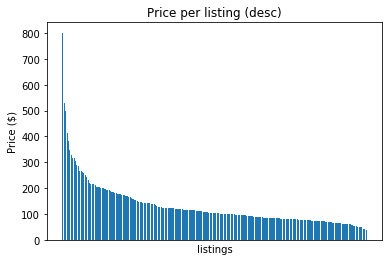

In [15]:
# Plot 
height = neighs_av_price.average_price
bars = neighs_av_price.neighbourhoods
y_pos = np.arange(len(bars))
plt.bar(bars, height)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)
plt.title('Price per listing (desc)')
plt.xlabel('listings')
plt.ylabel('Price ($)')
plt.show()

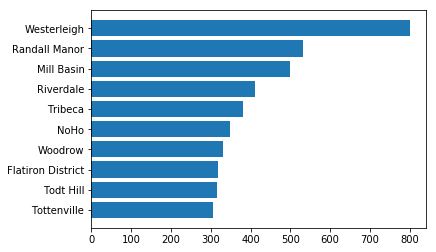

In [16]:
# Plot 10 most expensive
bars2, height2 = [], []
height = neighs_av_price.average_price[0:10].values
bars = neighs_av_price.neighbourhoods[0:10].values
for i in range(0,len(bars)):
    height2.append(height[len(height)-i-1])
    bars2.append(bars[len(bars)-i-1])
y_pos = np.arange(len(bars2))
plt.barh(bars2, height2)
plt.show()

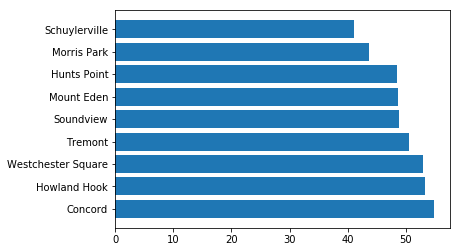

In [17]:
# Plot 10 cheapest 
height2, bars2 = [], []
height = neighs_av_price.average_price[-10:-1].values
bars = neighs_av_price.neighbourhoods[-10:-1].values
for i in range(0,len(bars)):
    height2.append(height[len(height)-i-1])
    bars2.append(bars[len(bars)-i-1])
y_pos = np.arange(len(bars))
plt.barh(bars, height)
# axes = plt.gca()
# axes.set_xlim([0,200])
plt.show()

In [18]:
## Check if neighbourhood groups typically have a high or low price

## 2.	Plot how the average price evolves through the year across New York.

In [19]:
cal_det_available = calendar_detail[calendar_detail['available'] == 't']
try: 
    cal_det_available['price'] = cal_det_available['price'].str.replace("$","")
    cal_det_available['price'] = cal_det_available['price'].str.replace(",","")
    cal_det_available.price = pd.to_numeric(cal_det_available.price, downcast = 'float')
except: 
    print("Already converted")

cal_det_available.head(10)

D:\Anaconda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
D:\Anaconda\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
D:\Anaconda\lib\site-packages\pandas\core\generic.py:5096: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in

,listing_id,date,available,price
0,2515,2018-10-01,t,99.0
1,2515,2018-09-30,t,89.0
2,2515,2018-09-29,t,99.0
3,2515,2018-09-28,t,99.0
4,2515,2018-09-27,t,99.0
5,2515,2018-09-26,t,99.0
6,2515,2018-09-25,t,99.0
7,2515,2018-09-24,t,99.0
8,2515,2018-09-23,t,99.0
9,2515,2018-09-22,t,99.0


In [20]:
df = cal_det_available.groupby('date').mean()['price']
av_price_ny = pd.DataFrame({
    'date' : df.keys().tolist(),
    'average_price' : df.tolist()
})
av_price_ny.head(2)

# Sort (voor de zekerheid)
av_price_ny = av_price_ny.sort_values('date', ascending = True)

D:\Anaconda\lib\site-packages\matplotlib\patches.py:75: UserWarning: Setting the 'color' property will overridethe edgecolor or facecolor properties.
  warnings.warn("Setting the 'color' property will override"


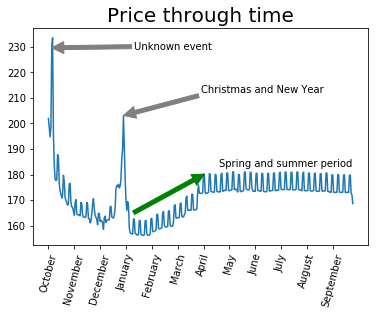

In [21]:
# Plot 
fig = plt.figure()
ax1 = fig.add_subplot(1,1,1)
height = av_price_ny.average_price
bars = av_price_ny.date
x_names = ['October', 'November', 'December', 'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September']

y_pos = np.arange(len(bars), step = 31)
plt.plot(bars, height)
plt.xticks(y_pos, x_names, rotation = 75)
#plt.grid(color='b', linestyle='--', linewidth=0.25)
plt.title('Price through time', fontsize = 20)
ax1.text(bars[205], 183, 'Spring and summer period')
ax1.annotate('Unknown event', (bars[4],height[4]), 
            xytext = (0.3,0.9), textcoords = 'axes fraction',
            arrowprops = dict(facecolor = 'grey', color = 'grey'))
ax1.annotate('Christmas and New Year', (bars[90],height[90]), 
            xytext = (0.5,0.7), textcoords = 'axes fraction',
            arrowprops = dict(facecolor = 'grey', color = 'grey'))
ax1.annotate('', (bars[187],height[187]), 
            xytext = (0.30,0.15), textcoords = 'axes fraction',
            arrowprops = dict(facecolor = 'green', color = 'green'))
plt.show()

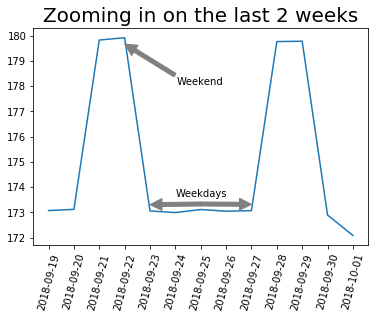

In [22]:
# Plot 10 latest data 
from matplotlib.patches import Ellipse
fig = plt.figure()
ax1 = fig.add_subplot(1,1,1)
height = av_price_ny.average_price[-14:-1].values
height2 = [x+0.25 for x in height]
height3 = [x-0.25 for x in height]
bars = av_price_ny.date[-14:-1].values
y_pos = np.arange(len(bars))
plt.plot(bars, height)
plt.xticks(y_pos, bars, rotation = 75)
#plt.grid(color='b', linestyle='--', linewidth=0.25)
plt.title('Zooming in on the last 2 weeks', fontsize = 20)

# weekdays
for i in range(0,5,4):
    ax1.annotate('', (bars[4+i],height2[4+i]), 
            xytext = (0.5,0.19), textcoords = 'axes fraction',
            arrowprops = dict(facecolor = 'grey', color = 'grey'))
ax1.text(bars[5], 173.6, 'Weekdays')

# weekends
ax1.annotate('Weekend', (bars[3],height3[3]), 
        xytext = (0.429,0.74), textcoords = 'axes fraction',
        arrowprops = dict(facecolor = 'grey', color = 'grey'))
#ax1.annotate('       ', (bars[9],height3[9]), 
#        xytext = (0.429,0.72), textcoords = 'axes fraction',
#        arrowprops = dict(facecolor = 'grey', color = 'grey'))

plt.show()

## 3.	Identify which neighborhood has the largest price fluctuations across the year. Plot the fluctuations for this neighborhood.

In [23]:
# Merge listings_detail and cal_det_available

In [24]:
print(cal_det_available.shape)
print(calendar_detail.shape)

(5582376, 4)
(16182640, 4)


In [25]:
# Get info we need from calendar_id and listings_detail
calendar_id_price = cal_det_available[['listing_id','date', 'price']]

listings_detail_id_neigh = listings_detail[['id','neighbourhood_cleansed']]
listings_detail_id_neigh.rename(columns={"id": "listing_id"}, inplace = True)

D:\Anaconda\lib\site-packages\pandas\core\frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


In [26]:
# Join 
date_neigh_price = pd.merge(calendar_id_price, listings_detail_id_neigh, how = 'left', on = 'listing_id')

In [27]:
print(date_neigh_price.shape)

(5582376, 4)


In [28]:
date_neigh_price.head()

,listing_id,date,price,neighbourhood_cleansed
0,2515,2018-10-01,99.0,Harlem
1,2515,2018-09-30,89.0,Harlem
2,2515,2018-09-29,99.0,Harlem
3,2515,2018-09-28,99.0,Harlem
4,2515,2018-09-27,99.0,Harlem


In [29]:
date_neigh_price.tail()

,listing_id,date,price,neighbourhood_cleansed
5582371,21178032,2017-10-09,50.0,Flushing
5582372,21178032,2017-10-08,50.0,Flushing
5582373,21178032,2017-10-04,50.0,Flushing
5582374,21178032,2017-10-03,50.0,Flushing
5582375,21178032,2017-10-02,50.0,Flushing


In [30]:
print(date_neigh_price.neighbourhood_cleansed.isnull().sum())
print(date_neigh_price.price.isnull().sum())
print(date_neigh_price.date.isnull().sum())

0
0
0


In [31]:
# Groupby 
grouped = date_neigh_price.groupby('neighbourhood_cleansed').std()['price']
neigh_std = pd.DataFrame({
    'neighs' : list(grouped.keys()),
    'stds' : list(grouped)
})
neigh_std.sort_values('stds', ascending = False).head(10)

,neighs,stds
155,Randall Manor,1679.697815
104,Jamaica,1135.490808
161,Riverdale,782.903969
167,Sea Gate,655.427890
39,Clinton Hill,619.622466
195,Upper West Side,540.833847
61,East New York,508.780804
142,Nolita,475.027285
20,Borough Park,466.265868
190,Tribeca,457.555512


In [32]:
# Prepare to plot (# Bumpy ride incoming) 
RandallManor = date_neigh_price[date_neigh_price.neighbourhood_cleansed == 'Randall Manor'].sort_values('date' , ascending = True)
RM_gb = RandallManor.groupby('date').mean()['price']
RM_date_avg = pd.DataFrame({
    'date' : list(RM_gb.keys()),
    'avg' : list(RM_gb)
})
RM_date_avg = RM_date_avg.sort_values('date')

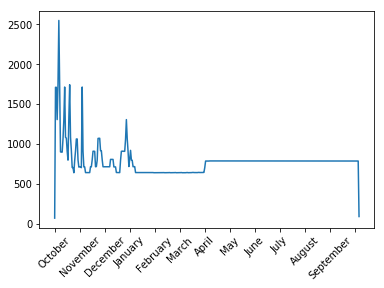

In [33]:
# Plot 
height = RM_date_avg.avg
bars = RM_date_avg.date
y_pos = np.arange(len(bars), step = 30)
x_names = ['October', 'November', 'December', 'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September']

plt.plot(bars, height)
plt.xticks(y_pos, x_names, rotation = 45)
plt.show()

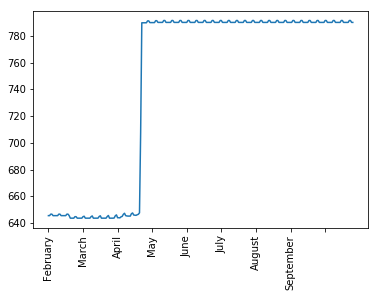

In [34]:
# zoom in on month 5 - 12 
height = RM_date_avg.avg[100:-1]
bars = RM_date_avg.date[100:-1]
y_pos = np.arange(len(bars), step = 30)
x_names = ['February', 'March', 'April', 'May', 'June', 'July', 'August', 'September']
plt.plot(bars, height)
plt.xticks(y_pos, x_names, rotation = 90)
plt.show()

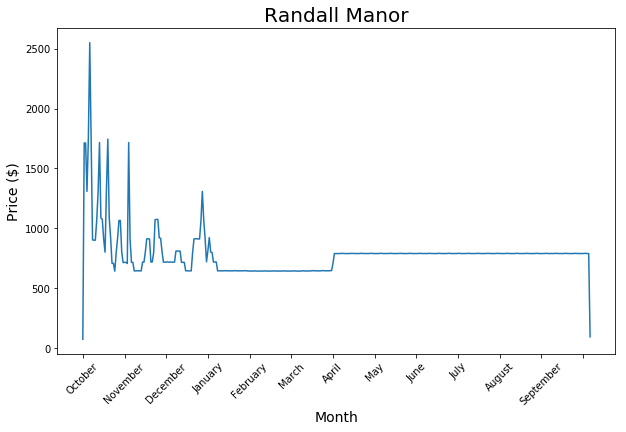

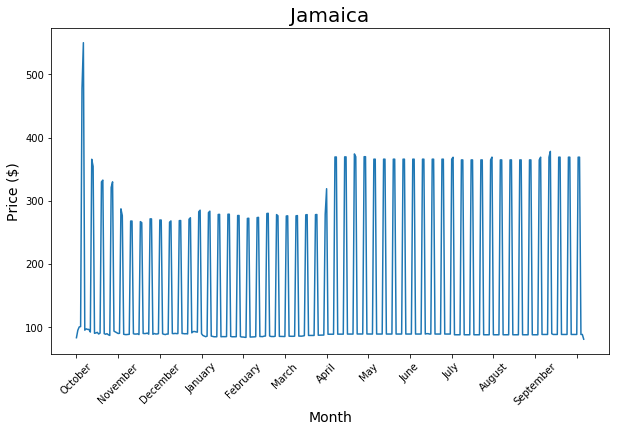

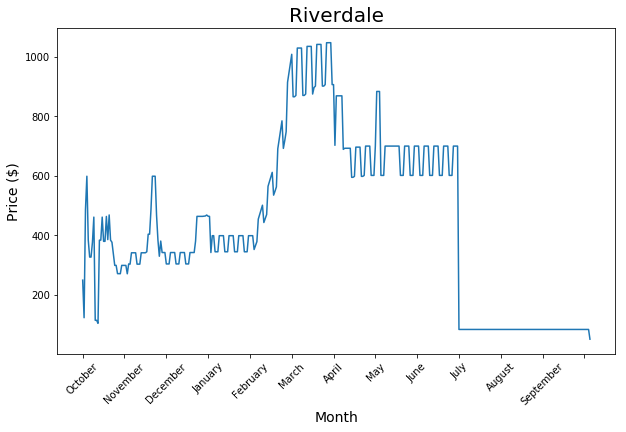

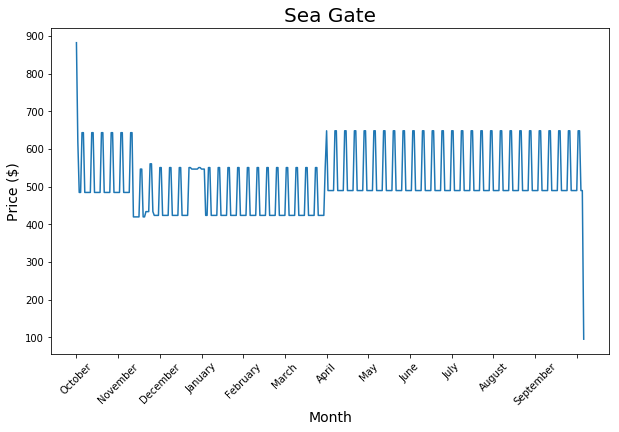

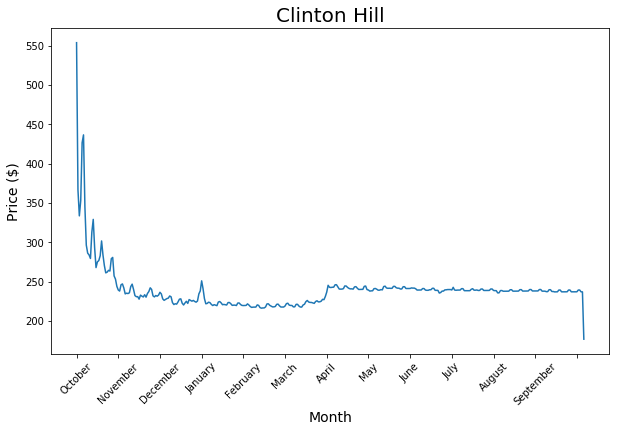

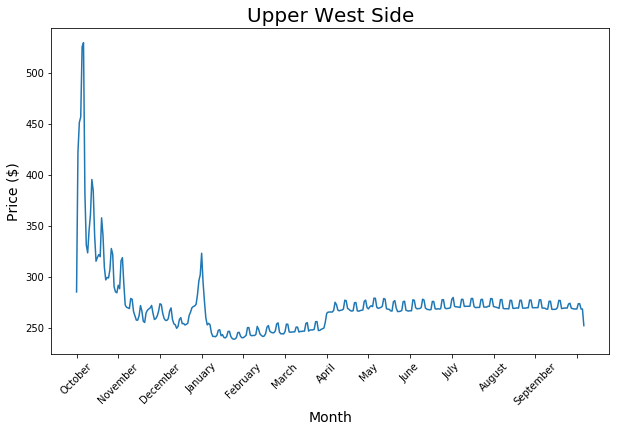

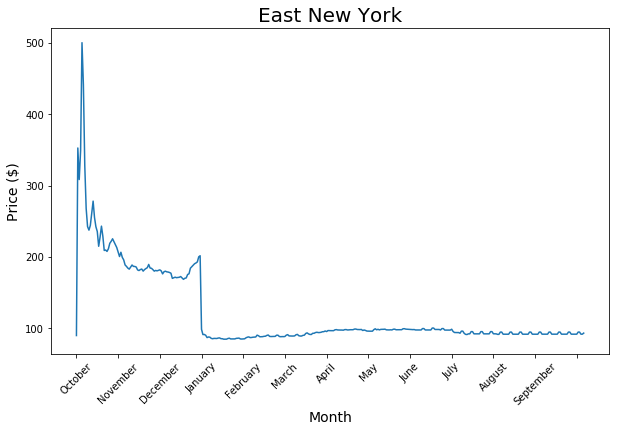

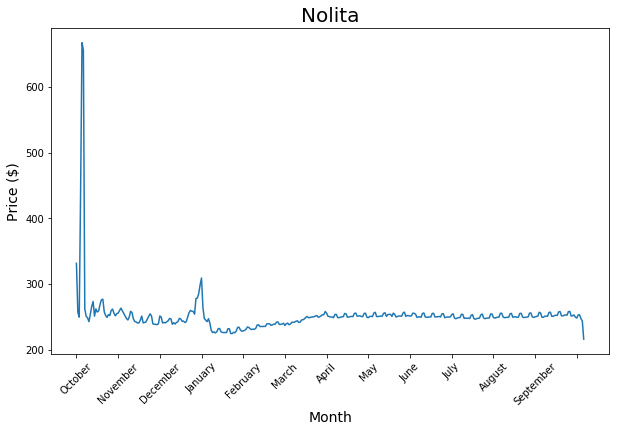

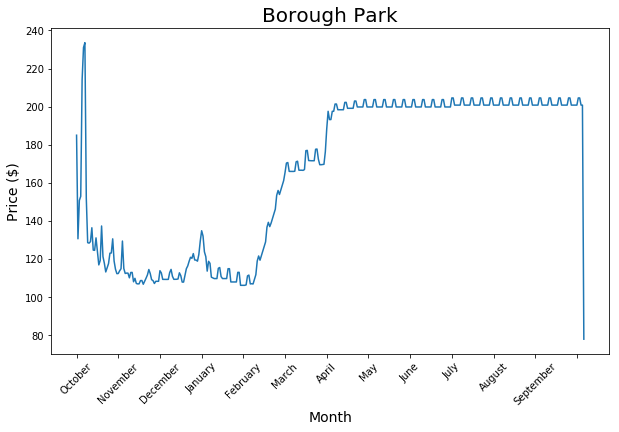

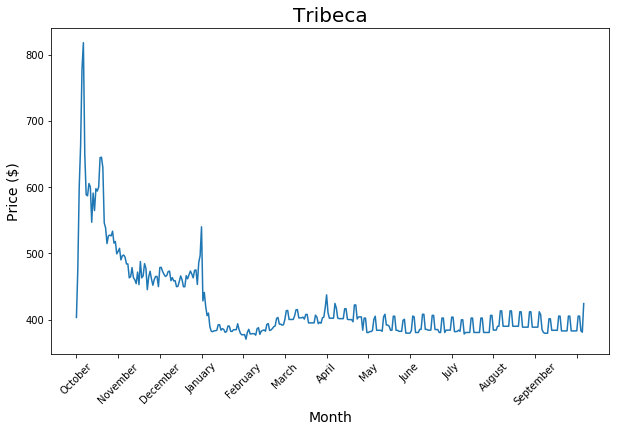

In [35]:
# Plot 10 most fluctuating neighbourhoods
# Plot 
neighbourhoods = list(neigh_std.sort_values('stds', ascending = False).head(10).neighs)


for i in range(0, len(neighbourhoods)):
    
    neighbourhood = neighbourhoods[i]
    neigh = date_neigh_price[date_neigh_price.neighbourhood_cleansed == neighbourhood].sort_values('date' , ascending = True)
    neigh_gb = neigh.groupby('date').mean()['price']
    neigh_date_avg = pd.DataFrame({
        'date' : list(neigh_gb.keys()),
        'avg' : list(neigh_gb)
    })
    neigh_date_avg = neigh_date_avg.sort_values('date')
    
    
    height = neigh_date_avg.avg
    bars = neigh_date_avg.date
    y_pos = np.arange(len(bars), step = 30)
    x_names = ['October', 'November', 'December', 'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September']
    
    plt.figure(figsize = (10,6))
    # plt.subplot(1,2,i+1)
    plt.plot(bars, height)
    plt.title(neighbourhood, fontsize = 20)
    plt.xticks(y_pos, x_names, rotation = 45)
    plt.xlabel('Month', fontsize = 14)
    plt.ylabel('Price ($)', fontsize = 14)
    #plt.grid(color='b', linestyle='--', linewidth=0.25)
    plt.show()

D:\Anaconda\lib\site-packages\matplotlib\patches.py:75: UserWarning: Setting the 'color' property will overridethe edgecolor or facecolor properties.
  warnings.warn("Setting the 'color' property will override"


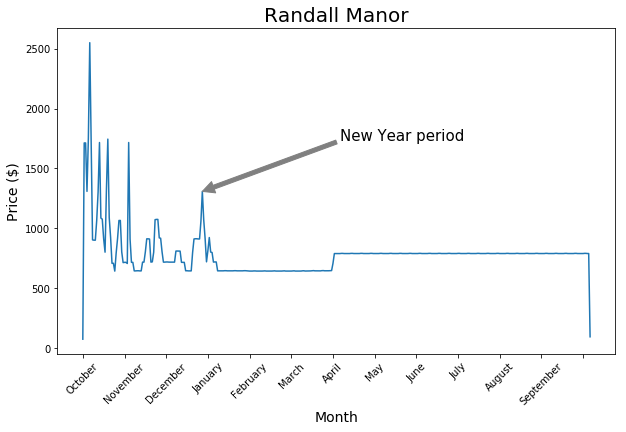

In [36]:
# Plot 10 most fluctuating neighbourhoods
# Plot 
neighbourhoods = list(neigh_std.sort_values('stds', ascending = False).head(10).neighs)

i = 0

neighbourhood = neighbourhoods[i]
neigh = date_neigh_price[date_neigh_price.neighbourhood_cleansed == neighbourhood].sort_values('date' , ascending = True)
neigh_gb = neigh.groupby('date').mean()['price']
neigh_date_avg = pd.DataFrame({
    'date' : list(neigh_gb.keys()),
    'avg' : list(neigh_gb)
})
neigh_date_avg = neigh_date_avg.sort_values('date')


height = neigh_date_avg.avg
bars = neigh_date_avg.date
y_pos = np.arange(len(bars), step = 30)
x_names = ['October', 'November', 'December', 'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September']

fig = plt.figure(figsize = (10,6))
ax1 = fig.add_subplot(1,1,1)
# plt.subplot(1,2,i+1)
plt.plot(bars, height)
plt.title(neighbourhood, fontsize = 20)
plt.xticks(y_pos, x_names, rotation = 45)
plt.xlabel('Month', fontsize = 14)
plt.ylabel('Price ($)', fontsize = 14)
# plt.grid(color='b', linestyle='--', linewidth=0.25)
# weekdays
ax1.annotate('', (bars[86],height[86]), 
xytext = (0.5,0.65), textcoords = 'axes fraction',
arrowprops = dict(facecolor = 'grey', color = 'grey'))
ax1.text(bars[185], 1730.6, 'New Year period', fontsize = 15)

plt.show()

D:\Anaconda\lib\site-packages\matplotlib\patches.py:75: UserWarning: Setting the 'color' property will overridethe edgecolor or facecolor properties.
  warnings.warn("Setting the 'color' property will override"


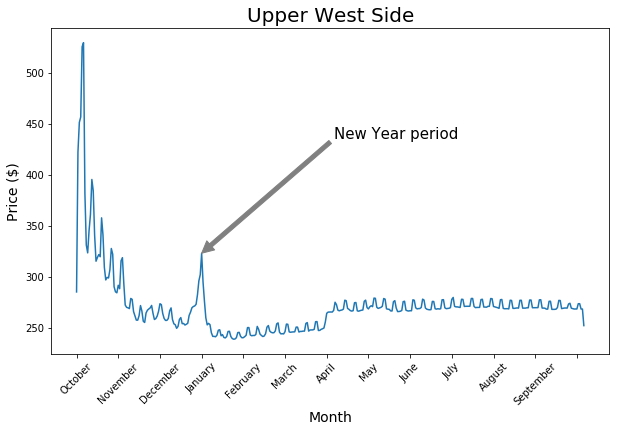

In [37]:
# Plot 10 most fluctuating neighbourhoods
# Plot 
neighbourhoods = list(neigh_std.sort_values('stds', ascending = False).head(10).neighs)

i = 5

neighbourhood = neighbourhoods[i]
neigh = date_neigh_price[date_neigh_price.neighbourhood_cleansed == neighbourhood].sort_values('date' , ascending = True)
neigh_gb = neigh.groupby('date').mean()['price']
neigh_date_avg = pd.DataFrame({
    'date' : list(neigh_gb.keys()),
    'avg' : list(neigh_gb)
})
neigh_date_avg = neigh_date_avg.sort_values('date')


height = neigh_date_avg.avg
bars = neigh_date_avg.date
y_pos = np.arange(len(bars), step = 30)
x_names = ['October', 'November', 'December', 'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September']

fig = plt.figure(figsize = (10,6))
ax1 = fig.add_subplot(1,1,1)
# plt.subplot(1,2,i+1)
plt.plot(bars, height)
plt.title(neighbourhood, fontsize = 20)
plt.xticks(y_pos, x_names, rotation = 45)
plt.xlabel('Month', fontsize = 14)
plt.ylabel('Price ($)', fontsize = 14)
# plt.grid(color='b', linestyle='--', linewidth=0.25)
# weekdays
ax1.annotate('', (bars[90],height[90]), 
xytext = (0.5,0.65), textcoords = 'axes fraction',
arrowprops = dict(facecolor = 'grey', color = 'grey'))
ax1.text(bars[185], 435, 'New Year period', fontsize = 15)

plt.show()

D:\Anaconda\lib\site-packages\matplotlib\patches.py:75: UserWarning: Setting the 'color' property will overridethe edgecolor or facecolor properties.
  warnings.warn("Setting the 'color' property will override"


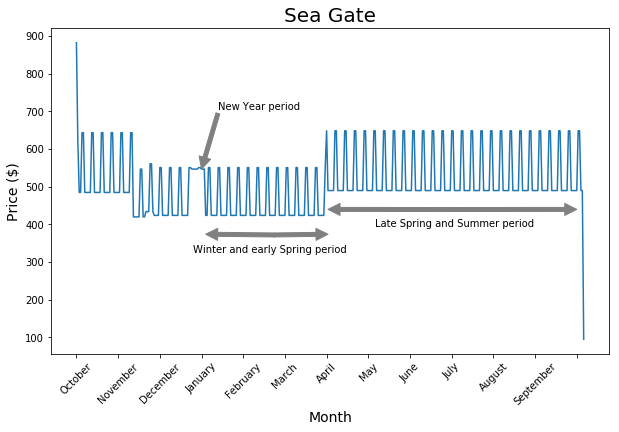

In [38]:
# Plot 10 most fluctuating neighbourhoods
# Plot 
neighbourhoods = list(neigh_std.sort_values('stds', ascending = False).head(10).neighs)

i = 3

neighbourhood = neighbourhoods[i]
neigh = date_neigh_price[date_neigh_price.neighbourhood_cleansed == neighbourhood].sort_values('date' , ascending = True)
neigh_gb = neigh.groupby('date').mean()['price']
neigh_date_avg = pd.DataFrame({
    'date' : list(neigh_gb.keys()),
    'avg' : list(neigh_gb)
})
neigh_date_avg = neigh_date_avg.sort_values('date')


height = neigh_date_avg.avg
height2 = [x-50 for x in height]
bars = neigh_date_avg.date
y_pos = np.arange(len(bars), step = 30)
x_names = ['October', 'November', 'December', 'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September']

fig = plt.figure(figsize = (10,6))
ax1 = fig.add_subplot(1,1,1)
# plt.subplot(1,2,i+1)
plt.plot(bars, height)
plt.title(neighbourhood, fontsize = 20)
plt.xticks(y_pos, x_names, rotation = 45)
plt.xlabel('Month', fontsize = 14)
plt.ylabel('Price ($)', fontsize = 14)
# plt.grid(color='b', linestyle='--', linewidth=0.25)
# weekdays
ax1.annotate('New Year period', (bars[90],height[90]), 
xytext = (0.3,0.75), textcoords = 'axes fraction',
             arrowprops = dict(facecolor = 'grey', color = 'grey'))

# Winter + early spring
ax1.annotate('', (bars[93],height2[93]), 
xytext = (0.4,0.365), textcoords = 'axes fraction',
             arrowprops = dict(facecolor = 'grey', color = 'grey'), 
             fontsize = 15)
ax1.annotate('', (bars[181],height2[93]), 
xytext = (0.4,0.365), textcoords = 'axes fraction',
             arrowprops = dict(facecolor = 'grey', color = 'grey'), 
             fontsize = 15)
ax1.text(bars[84], 325, 'Winter and early Spring period')

# Late spring + summer
ax1.annotate('', (bars[181],height2[185]), 
xytext = (0.7,0.443), textcoords = 'axes fraction',
             arrowprops = dict(facecolor = 'grey', color = 'grey'), 
             fontsize = 15)
ax1.annotate('', (bars[360],height2[185]), 
xytext = (0.7,0.443), textcoords = 'axes fraction',
             arrowprops = dict(facecolor = 'grey', color = 'grey'), 
             fontsize = 15)
ax1.text(bars[215], 395, 'Late Spring and Summer period')

plt.show()

D:\Anaconda\lib\site-packages\matplotlib\patches.py:75: UserWarning: Setting the 'color' property will overridethe edgecolor or facecolor properties.
  warnings.warn("Setting the 'color' property will override"


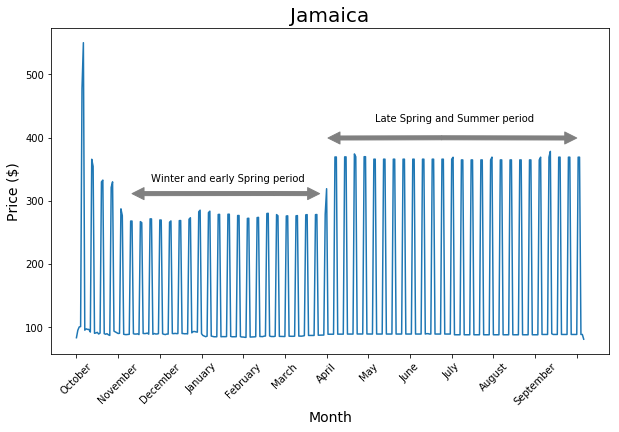

In [39]:
# Plot 10 most fluctuating neighbourhoods
# Plot 
neighbourhoods = list(neigh_std.sort_values('stds', ascending = False).head(10).neighs)

i = 1

neighbourhood = neighbourhoods[i]
neigh = date_neigh_price[date_neigh_price.neighbourhood_cleansed == neighbourhood].sort_values('date' , ascending = True)
neigh_gb = neigh.groupby('date').mean()['price']
neigh_date_avg = pd.DataFrame({
    'date' : list(neigh_gb.keys()),
    'avg' : list(neigh_gb)
})
neigh_date_avg = neigh_date_avg.sort_values('date')


height = neigh_date_avg.avg
height2 = [x+30 for x in height]
bars = neigh_date_avg.date
y_pos = np.arange(len(bars), step = 30)
x_names = ['October', 'November', 'December', 'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September']

fig = plt.figure(figsize = (10,6))
ax1 = fig.add_subplot(1,1,1)
# plt.subplot(1,2,i+1)
plt.plot(bars, height)
plt.title(neighbourhood, fontsize = 20)
plt.xticks(y_pos, x_names, rotation = 45)
plt.xlabel('Month', fontsize = 14)
plt.ylabel('Price ($)', fontsize = 14)
# plt.grid(color='b', linestyle='--', linewidth=0.25)


# Winter + early spring
ax1.annotate('', (bars[40],height2[95]), 
xytext = (0.4,0.492), textcoords = 'axes fraction',
             arrowprops = dict(facecolor = 'grey', color = 'grey'), 
             fontsize = 15)
ax1.annotate('', (bars[175],height2[95]), 
xytext = (0.4,0.492), textcoords = 'axes fraction',
             arrowprops = dict(facecolor = 'grey', color = 'grey'), 
             fontsize = 15)
ax1.text(bars[54], 330, 'Winter and early Spring period')

# Late spring + summer
ax1.annotate('', (bars[181],height2[186]), 
xytext = (0.7,0.663), textcoords = 'axes fraction',
             arrowprops = dict(facecolor = 'grey', color = 'grey'), 
             fontsize = 15)
ax1.annotate('', (bars[360],height2[186]), 
xytext = (0.7,0.663), textcoords = 'axes fraction',
             arrowprops = dict(facecolor = 'grey', color = 'grey'), 
             fontsize = 15)
ax1.text(bars[215], 425, 'Late Spring and Summer period')

plt.show()

## 4.	In marketing, there is a phenomenon known as ‘the long tail’ (Hint: look it up). This also translates to the number of reviews. Plot this on an intuitive graph.

In [40]:
# https://www.marketingtermen.nl/begrip/long-tail

In [41]:
# 
group = reviews_summary.groupby('listing_id').count()
id_freq_of_rev = pd.DataFrame({
    'id' : list(group.date.keys()),
    'freq' : list(group.date)
})
id_freq_of_rev = id_freq_of_rev.sort_values('freq', ascending = False) 

id_freq_of_rev.head()

,id,freq
2642,903972,489
2620,891117,474
2641,903947,465
122,21218,394
146,26785,383


In [42]:
group = id_freq_of_rev.groupby('freq').count()
long_tail_df = pd.DataFrame({
    'freq' : list(group.id.keys()),
    'freq_freq' : list(group.id)
})
long_tail_df = long_tail_df.sort_values('freq_freq', ascending = False) 

long_tail_df.head()

,freq,freq_freq
0,1,4630
1,2,3353
2,3,2483
3,4,1855
4,5,1627


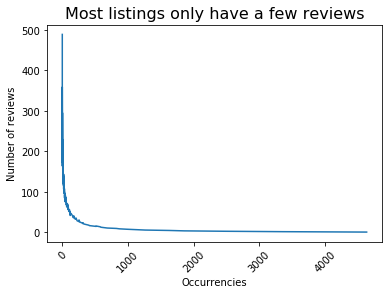

In [43]:
# plot
y = long_tail_df.freq
X = long_tail_df.freq_freq
x_names = np.arange(max(X), step = 1000)
plt.plot(X, y)
plt.xticks(x_names, x_names, rotation = 45)
plt.ylabel('Number of reviews')
plt.xlabel('Occurrencies')
plt.title('Most listings only have a few reviews', fontsize = 16)
plt.show()

In [44]:
# Clearly, the 'long tail' story holds here. There are only some listing_ids with a lot of reviews, 
# but there are also a lot of listing_ids which have barely 

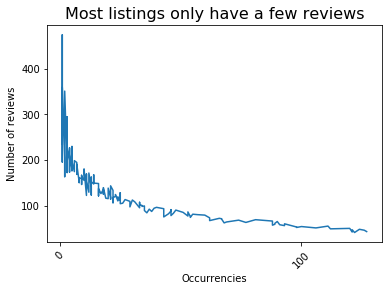

In [45]:
# plot
y = long_tail_df.freq[-250:-1]
X = long_tail_df.freq_freq[-250:-1]
x_names = np.arange(max(X), step = 100)
plt.plot(X, y)
plt.xticks(x_names, x_names, rotation = 45)
plt.ylabel('Number of reviews')
plt.xlabel('Occurrencies')
plt.title('Most listings only have a few reviews', fontsize = 16)
plt.show()

## 5.	Run a regression to explain the price per listing. (Hint: location, reviews, etc. may all explain this).

See document 'LinearRegression_price'.

See also 'ML_price_classification' for a machine learning extension.

## 6.	Find additional data sources to explain the average listing price per neighborhood. (Hint: think demographics).

Also: see document 'LinearRegression_price'.

#### source wikipedia: density per neighborhood group and square km per neighborhood group

In [46]:
neighb_extraData= pd.DataFrame({"neighbourhood_group_cleansed": ["Bronx","Brooklyn","Manhattan", "Queens","Staten Island" ], "GDP per capita": [19570,23900,378250,31310,23460], "Persons per sq. km": [13231,14649,27826,8354,3132]})
neighb_extraData.head()

,neighbourhood_group_cleansed,GDP per capita,Persons per sq. km
0,Bronx,19570,13231
1,Brooklyn,23900,14649
2,Manhattan,378250,27826
3,Queens,31310,8354
4,Staten Island,23460,3132


In [47]:
listings_detail_needed = listings_detail[["neighbourhood_group_cleansed","latitude", "longitude"]]
data=listings_detail_needed.merge(neighb_extraData, on="neighbourhood_group_cleansed" )

In [50]:
#!pip install folium

In [51]:
import folium
from folium import plugins
neighbourhoods_geojson
m = folium.Map([40.730610, -73.935242], zoom_start=10)
folium.Choropleth(
    geo_data=neighbourhoods_geojson,
    name='choropleth',
    data=data,
    columns=['neighbourhood_group_cleansed','Persons per sq. km' ],
    key_on='feature.properties.neighbourhood_group',
     fill_color='Reds',
    fill_opacity=0.9,   
    line_opacity=0.2,    
    legend_name='Density per neighbourhood group',    
).add_to(m)

folium.LayerControl().add_to(m)
m

In [52]:
# Open in webbrowser
import webbrowser
m.save('density.html') # Save as html file
webbrowser.open('density.html') # Default browser open

True

In [53]:
bins= [19570, 20000,32000,50000, 100000, 200000,378300]
import folium
from folium import plugins
neighbourhoods_geojson
m = folium.Map([40.730610, -73.935242], zoom_start=10)
folium.Choropleth(
    geo_data=neighbourhoods_geojson,
    name='choropleth',
    data=data,
    columns=['neighbourhood_group_cleansed','GDP per capita' ],
    key_on='feature.properties.neighbourhood_group',
     fill_color='Reds',
    fill_opacity=0.8,
    line_opacity=0.2,
    bins=bins,
    legend_name='GDP per capita per neighbourhood group',    
).add_to(m)

folium.LayerControl().add_to(m)
m

In [54]:
# Open in webbrowser
import webbrowser
m.save('GDP.html') # Save as html file

webbrowser.open('GDP.html') # Default browser open

True

## 7.	Plot how the average prices differ across New York using a color-coded heat map of New York neighborhoods.

### 7.1 Entire city 

In [55]:
#!pip install folium
import folium
from folium import plugins
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [56]:
m = folium.Map([40.730610, -73.935242], zoom_start=10)

In [57]:
lat= pd.to_numeric(listings_detail["latitude"],errors='coerce')
long= pd.to_numeric(listings_detail["longitude"],errors='coerce')
listings_detail["longitude"]=pd.to_numeric(listings_detail["longitude"],errors='coerce')
listings_detail["latitude"]=pd.to_numeric(listings_detail["latitude"],errors='coerce')
heat_df = listings_detail[['latitude', 'longitude']]

listings_detail["latitude"].head()

0    40.774142
1    40.849191
2    40.849775
3    40.848838
4    40.841144
Name: latitude, dtype: float64

In [58]:
try :
    listings_detail["price"].head()
    listings_detail['price'] = listings_detail['price'].str.replace("$","")
    listings_detail['price'] = listings_detail['price'].str.replace(",","")
    listings_detail.price = pd.to_numeric(listings_detail.price, downcast = 'float')
    counts=listings_detail.price 
    listings_detail["price"].head()
except:
    print("Already done")

In [59]:
from folium.plugins import HeatMap
HeatMap(data=listings_detail[['latitude', 'longitude', 'price']].groupby(['latitude', 'longitude']).mean().reset_index().values.tolist(), radius=8, max_zoom=13).add_to(m)

In [60]:
m

In [61]:
# Open in webbrowser
import webbrowser
m.save('heatmap.html') # Save as html file

webbrowser.open('heatmap.html') # Default browser open

True

### 7.2 Neighborhood groups 

In [62]:
df = listings_summary.groupby('neighbourhood_group').mean()['price']
neighs_av_price = pd.DataFrame({
    'neighbourhoods' : df.keys().tolist(),
    'average_price' : df.tolist()
})
neighs_av_price.head(2)

,neighbourhoods,average_price
0,Bronx,88.910240
1,Brooklyn,120.701624


In [63]:
import folium
from folium import plugins
neighbourhoods_geojson
m = folium.Map([40.730610, -73.935242], zoom_start=10)
bins= [0,1,30,150,151,300,450,570,690,805]

folium.Choropleth(
    geo_data=neighbourhoods_geojson,
    name='choropleth',
    data=neighs_av_price,
   columns=['neighbourhoods','average_price' ],
    key_on='feature.properties.neighbourhood_group',
     fill_color='Reds',
    fill_opacity=0.9,
   line_opacity=0.2,
    legend_name='Average price per night per neighbourhood group'
).add_to(m)

folium.LayerControl().add_to(m)

m

In [64]:
# Open in webbrowser
import webbrowser
m.save('avg_prices.html') # Save as html file

webbrowser.open('avg_prices.html') # Default browser open

True

### 7.3 Neighborhoods

In [65]:
df = listings_summary.groupby('neighbourhood').mean()['price']
neighs_av_price = pd.DataFrame({
    'neighbourhoods' : df.keys().tolist(),
    'average_price' : df.tolist()
})
neighs_av_price.head(2)

,neighbourhoods,average_price
0,Allerton,71.086957
1,Arden Heights,37.750000


In [66]:
import folium
from folium import plugins
neighbourhoods_geojson
m = folium.Map([40.730610, -73.935242], zoom_start=10)
bins= [0,1,30,150,151,300,450,570,690,805]

folium.Choropleth(
    geo_data=neighbourhoods_geojson,
    name='choropleth',
    data=neighs_av_price,
   columns=['neighbourhoods','average_price' ],
    key_on='feature.properties.neighbourhood',
     fill_color='Reds',
    fill_opacity=0.9,
   line_opacity=0.2,
    bins=bins,
    legend_name='Average price per night per neighbourhood'
).add_to(m)

folium.LayerControl().add_to(m)

m

## 8.	The latitude of Statue of Liberty National Monument, New York, USA is 40.689247, and the longitude is -74.044502. This monument is one the most popular tourist places in New York. Statistically test whether a distance smaller than 2 miles to the monument increases average listing price.

In [74]:
clean_dollar(listings_detail, 'price')

already converted


In [75]:
import math
def distance_from_SoL(lat_1_lon_1):
    lat_1_lon_1 = lat_1_lon_1.split(',')
    lat1 = float(lat_1_lon_1[0])
    lon1 = float(lat_1_lon_1[1])
    lat2 =  40.689247
    lon2 = -74.044502
    radius = 3959 # miles

    dlat = math.radians(lat2-lat1)
    dlon = math.radians(lon2-lon1)
    a = math.sin(dlat/2) * math.sin(dlat/2) + math.cos(math.radians(lat1)) \
        * math.cos(math.radians(lat2)) * math.sin(dlon/2) * math.sin(dlon/2)
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
    d = radius * c

    return d

In [76]:
# calculate the distance for every row and flag when bigger than 2
listings_detail['dist_from_SOL'] = 0
listings_detail['lat_lon'] = ['{}, {}'.format(x,y) for x,y in zip(listings_detail.latitude,listings_detail.longitude)]
listings_detail['dist_from_SOL'] = listings_detail['lat_lon'].apply(lambda x: distance_from_SoL(x))
listings_detail['distance_flag'] = listings_detail['dist_from_SOL'].apply(lambda x: 0 if x < 2 else 1)

In [77]:
# Test the outcome of the flagging
listings_detail = listings_detail.sort_values('dist_from_SOL')
print(listings_detail[['dist_from_SOL','distance_flag']].head())
print(listings_detail[['dist_from_SOL','distance_flag']].tail())

       dist_from_SOL  distance_flag
31685       1.551424              0
31677       1.575248              0
31674       1.671550              0
31694       1.703789              0
31676       1.732006              0
       dist_from_SOL  distance_flag
38486      18.115936              1
38500      18.152777              1
38511      18.215858              1
38502      18.240721              1
44298      18.446764              1


In [78]:
# First check: calculate the mean price
mean_prices = listings_detail.groupby('distance_flag').mean()['price']
mean_prices

distance_flag
0    192.311111
1    147.585114
Name: price, dtype: float32

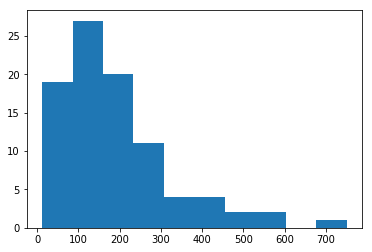

In [79]:
prices_in_2miles = listings_detail[listings_detail['distance_flag'] == 0]
prices_out_2miles = listings_detail[listings_detail['distance_flag'] == 1]
plt.hist(prices_in_2miles['price'])
plt.show()

probably not normally distributed

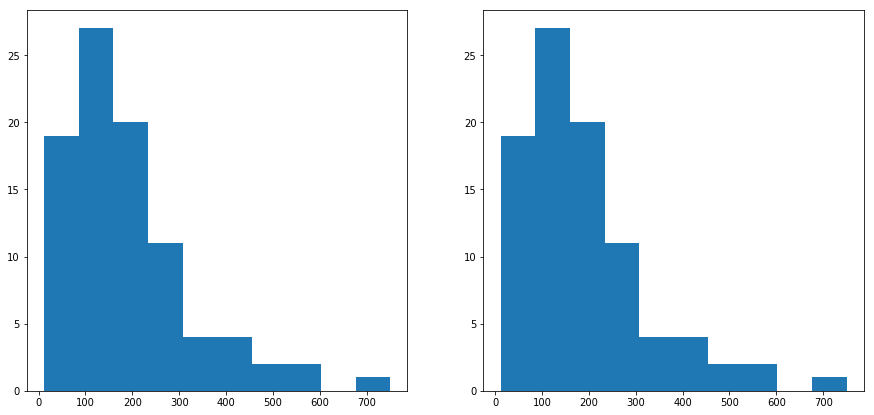

In [81]:
from matplotlib.pyplot import figure
figure(num = None, figsize = (15,7))
plt.subplot(1,2,1)
plt.hist(prices_in_2miles['price'])
plt.subplot(1,2,2)
plt.hist(prices_in_2miles[prices_in_2miles['price'] < 800]['price'])
plt.show()

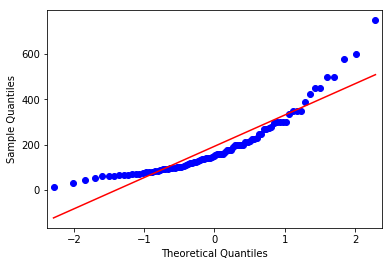

In [82]:
# Check QQplot for normal distribution
from statsmodels.graphics.gofplots import qqplot
qqplot(prices_in_2miles['price'], line='s')
plt.show()

The data does not look normally distributed

In [83]:
# Shapiro-Wilk 
from scipy.stats import shapiro
stat, p = shapiro(prices_in_2miles['price'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

Statistics=0.855, p=0.000
Sample does not look Gaussian (reject H0)


In [84]:
# test if normally distributed
from scipy import stats
stats.ttest_ind(prices_in_2miles.price, prices_out_2miles.price)

Ttest_indResult(statistic=2.026843818618294, pvalue=0.042684362800395885)

The data is not normally distributed

In [85]:
# Test if means are equal (non-parametric test: Kruskal Wallis)
from scipy.stats import kruskal
stats.kruskal(prices_in_2miles.price.values, prices_out_2miles.price.values)

KruskalResult(statistic=20.026956198649568, pvalue=7.635813876135583e-06)

In [86]:
# Test if means are equal (non-parametric test: Mann Whitney U)
from scipy.stats import mannwhitneyu
stats.mannwhitneyu(prices_in_2miles.price.values, prices_out_2miles.price.values)

MannwhitneyuResult(statistic=1447739.0, pvalue=3.817980645727418e-06)

## 9.	Create a timeline and plot for each year the highest, Q1, the median, Q3 and lowest price on one graph. Do this for each neighborhood group as well as for the entire city. Determine which neighborhood group stands out the most and create a comparative graph of this neighborhood with all other groups.

In [87]:
cal_det_available['month'] = cal_det_available['date'].str.slice(start = 5, stop = 7)
listings_detail_needed = listings_detail[["id","neighbourhood_group_cleansed"]]
listings_detail_needed.rename(columns={"id":"listing_id"}, inplace = True)
listing_date_neighbourhood = pd.merge(cal_det_available,listings_detail_needed, how = "left", on = "listing_id")

D:\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
D:\Anaconda\lib\site-packages\pandas\core\frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


In [88]:
#neighbourhoodgroups
neighbourhoodgroups = ['Bronx', 'Manhattan', 'Queens','Brooklyn']
output = []

def percentile(n):
    def percentile_(x):
        return np.percentile(x, n)
    percentile_.__name__ = 'percentile_%s' % n
    return percentile_

for i in range(0,len(neighbourhoodgroups)):
    neigh_group = neighbourhoodgroups[i]
    agg = {'price':[np.min,percentile(25),np.median,percentile(75),np.max]} 
    grouped = listing_date_neighbourhood[listing_date_neighbourhood.neighbourhood_group_cleansed == neigh_group].groupby('month').agg(agg)
    outputframe = pd.DataFrame({
        'months': list(grouped.price.amin.keys()),
        'min': list(grouped.price['amin']),
        'Q1': list(grouped.price['percentile_25']),
        'median': list(grouped.price['median']),
        'Q3': list(grouped.price['percentile_75']),
        'max': list(grouped.price['amax'])
    })
    output.append(outputframe)

#entire city
agg_city = {'price':[np.min,percentile(25),np.median,percentile(75),np.max]} 
grouped_city = listing_date_neighbourhood.groupby('month').agg(agg_city)
outputframe_city = pd.DataFrame({
    'months': list(grouped_city.price.amin.keys()),
    'min': list(grouped_city.price['amin']),
    'Q1': list(grouped_city.price['percentile_25']),
    'median': list(grouped_city.price['median']),
    'Q3': list(grouped_city.price['percentile_75']),
    'max': list(grouped_city.price['amax'])
    })

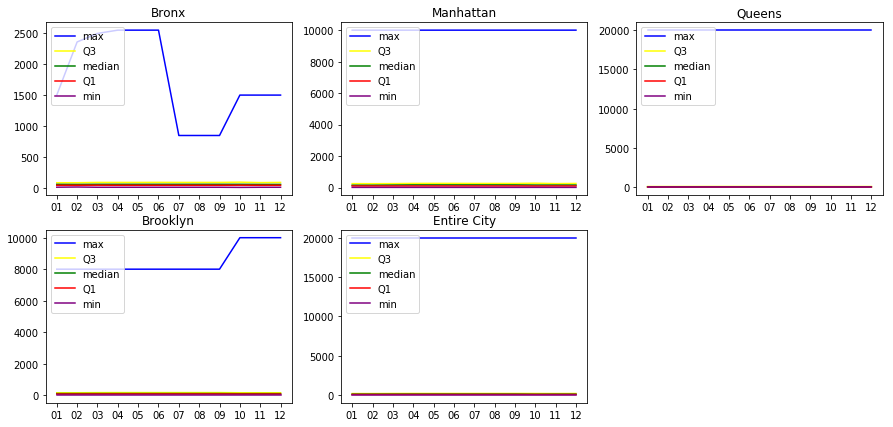

In [89]:
from matplotlib.pyplot import figure

#NEIGHBOURHOODGROUPS
figure(num=None,figsize = (15,7))
for i in range(0,len(neighbourhoodgroups)):
    plt.subplot(2, 3, i+1)
    plt.plot(output[i]["months"], output[i]["max"], color="blue", label="max")
    plt.plot(output[i]["months"], output[i]["Q3"], color="yellow", label="Q3")
    plt.plot(output[i]["months"], output[i]["median"], color="green", label="median")
    plt.plot(output[i]["months"], output[i]["Q1"], color="red", label="Q1")
    plt.plot(output[i]["months"], output[i]["min"], color="purple", label="min")
    plt.title(neighbourhoodgroups[i])
    plt.legend(loc="upper left")

          
#ENTIRE CITY
plt.subplot(2, 3, 5)
plt.plot(outputframe_city["months"], outputframe_city["max"], color="blue", label="max")
plt.plot(outputframe_city["months"], outputframe_city["Q3"], color="yellow", label="Q3")
plt.plot(outputframe_city["months"], outputframe_city["median"], color="green", label="median")
plt.plot(outputframe_city["months"], outputframe_city["Q1"], color="red", label="Q1")
plt.plot(outputframe_city["months"], outputframe_city["min"], color="purple", label="min")
plt.title("Entire City")
plt.legend(loc="upper left")

plt.show()

## 10.	Plot the number of rooms per host in function of the number of reviews per host. 

In [90]:
data = []
data = listings_detail.groupby('host_id')['number_of_reviews'].sum()


unique_hostid1 = list(data.keys())
counts1 = list(data)

dict1 = {'hostid': unique_hostid1, 
        'numberOfReviews': counts1}

df1 = pd.DataFrame(dict1) 
#df1


In [91]:
data2 = listings_detail.groupby('host_id').count()['id']

unique_hostid2 = list(data2.keys())
count_id = list(data2)

dict2 = {'hostid': unique_hostid2, 
        'AmountOfListings': count_id}
df2 = pd.DataFrame(dict2) 
df2



,hostid,AmountOfListings
0,72,1
1,283,1
2,2571,1
3,2600,1
4,2758,3
5,2782,2
6,2787,7
7,2845,2
8,2881,2
9,3211,1


In [92]:
##testing if correct
listings_detail[listings_detail['host_id'] == 2758]
#3 listings and 352 reviews, correct

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,dist_from_SOL,lat_lon,distance_flag
23659,8225,https://www.airbnb.com/rooms/8225,20171002002103,2017-10-02,Stay at Chez Chic budget Room #2,Step into our artistic spacious apartment and ...,PLEASE BOOK DIRECTLY. NO NEED TO SEND A REQUES...,Step into our artistic spacious apartment and ...,none,NaN,...,f,f,strict,f,f,3,1.26,8.942234,"40.79903412423927, -73.95406295429153",1
21246,385853,https://www.airbnb.com/rooms/385853,20171002002103,2017-10-03,Central Park Artsy Guest Room,Step into our artistic spacious apartment and ...,The best deal!!! Private budget bedroom for up...,Step into our artistic spacious apartment and ...,none,"Central Park is across the street, Restaurant ...",...,f,f,strict,f,f,3,1.07,8.950668,"40.79949443577005, -73.95473623361758",1
21830,2515,https://www.airbnb.com/rooms/2515,20171002002103,2017-10-02,Stay at Chez Chic budget room #1,Step into our artistic spacious apartment and ...,-PLEASE BOOK DIRECTLY. NO NEED TO SEND A REQUE...,Step into our artistic spacious apartment and ...,none,NaN,...,f,f,strict,f,f,3,1.43,8.962974,"40.79920479936168, -73.95367574543542",1


In [93]:
merger = pd.merge(df1,
                  df2[['hostid', 'AmountOfListings']],
                  on = 'hostid')
#merger


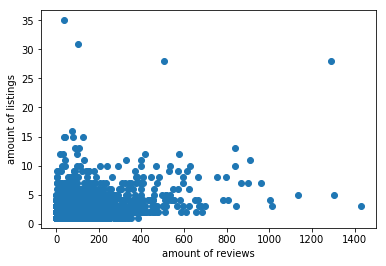

In [94]:
x = merger.numberOfReviews
y = merger.AmountOfListings


plt.scatter(x,y)

# naming the x axis 
plt.xlabel('amount of reviews') 
# naming the y axis 
plt.ylabel('amount of listings') 


# giving a title to my graph 
plt.title('') 
plt.show()


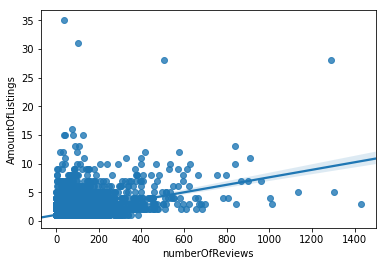

In [95]:
# library & dataset
import seaborn as sns
df = sns.load_dataset('iris')
 
# use the function regplot to make a scatterplot
sns.regplot(x, y)
#sns.plt.show()
 



## 11.	Are there a lot of hosts having multiple locations? Do most people just rent their own place? Is there a ‘host long tail’? Make a comprehensive plot.

In [96]:
top_host=listings_detail.host_id.value_counts().head(10)
top_host2 = list(top_host.keys())

In [97]:
names = []
for i in range(0,len(top_host2)):
    name = listings_detail.loc[listings_detail['host_id'] == top_host2[i], 'host_name'].iloc[0]
    names.append(name)
names

['Stat',
 'ResortShare5',
 'The Bowery House',
 'Dana',
 'Host',
 'Mae',
 'Ali',
 'Matthew',
 'Femi',
 'Carrie']

[Text(0, 0, 'Stat'),
 Text(0, 0, 'ResortShare5'),
 Text(0, 0, 'The Bowery House'),
 Text(0, 0, 'Dana'),
 Text(0, 0, 'Host'),
 Text(0, 0, 'Mae'),
 Text(0, 0, 'Ali'),
 Text(0, 0, 'Matthew'),
 Text(0, 0, 'Femi'),
 Text(0, 0, 'Carrie')]

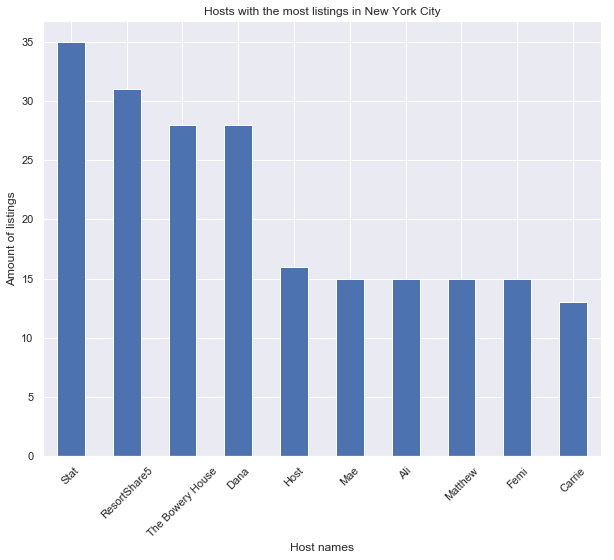

In [98]:
#setting figure size for future visualizations
sns.set(rc={'figure.figsize':(10,8)})

 
fig = top_host.plot(kind='bar')
fig.set_title('Hosts with the most listings in New York City')
fig.set_ylabel('Amount of listings')
fig.set_xlabel('Host names')
fig.set_xticklabels(names, rotation=45)



In [99]:
# grouped amount of listings: long tail 
longtail = df2.groupby('AmountOfListings').count()['hostid']
xas = list(longtail)
yas = list(longtail.keys())

Text(0.5, 1.0, 'Amount of listings per hosts')

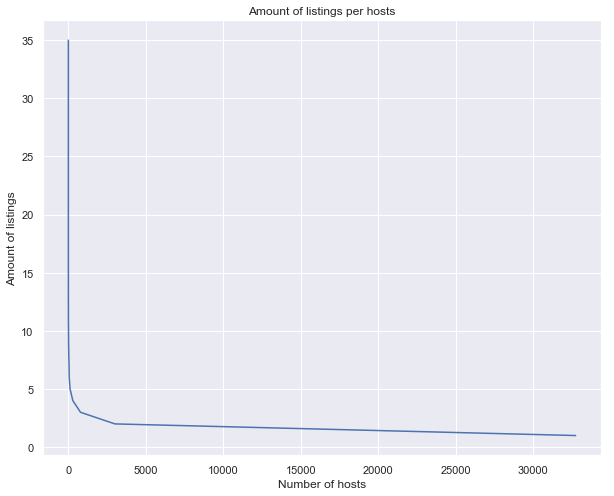

In [100]:
plt.plot(xas, yas)

# naming the x axis 
plt.ylabel('Amount of listings') 
# naming the y axis 
plt.xlabel('Number of hosts') 


# giving a title to my graph 
plt.title('Amount of listings per hosts') 


In [101]:
##extra info over tophosts?? welke type van listing?? 
#host_id: top_host2
top_host2

listings_detail.room_type
#room_type
#property_type

31685    Entire home/apt
31677    Entire home/apt
31674    Entire home/apt
31694       Private room
31676    Entire home/apt
31709    Entire home/apt
31680       Private room
31710       Private room
1455     Entire home/apt
1429        Private room
31662       Private room
1420     Entire home/apt
1422     Entire home/apt
1428     Entire home/apt
31695    Entire home/apt
31669       Private room
1410     Entire home/apt
31673    Entire home/apt
17154    Entire home/apt
31675    Entire home/apt
17102        Shared room
1442     Entire home/apt
16985    Entire home/apt
31671    Entire home/apt
17050    Entire home/apt
16890       Private room
31702    Entire home/apt
16977    Entire home/apt
16996    Entire home/apt
16787    Entire home/apt
              ...       
6        Entire home/apt
38506    Entire home/apt
16685       Private room
2        Entire home/apt
7           Private room
38499    Entire home/apt
38492       Private room
38514       Private room
12       Entire home/apt


## 12.	Do hosts with multiple locations stay within the same neighborhood? (Hint: use subset).

In [102]:
#remove hosts with only 1 listing
data = listings_detail.groupby('host_id').count()['id']

df2 = pd.DataFrame({'host_id': list(data.keys()), 
        'AmountOfListings': list(data)})

hostsmultiplelistings = df2[df2['AmountOfListings'] != 1]

In [103]:
hostsandneighbourhoods = listings_detail.groupby(['host_id', 'neighbourhood']).size().reset_index(name='count')

In [104]:
rightoutermerge = pd.merge(hostsmultiplelistings, hostsandneighbourhoods, on='host_id', how='right')

count = rightoutermerge.groupby("host_id").count()['neighbourhood']
countdf = pd.DataFrame({ 'host_id' : list(count.keys()),
                        'differentneighbourhoods' : list(count)
            })

freq = countdf.groupby('differentneighbourhoods').count()

freqdf = pd.DataFrame({'range' : freq['host_id'].keys(),
                      'number of hosts' : list(freq['host_id'])})

<BarContainer object of 7 artists>

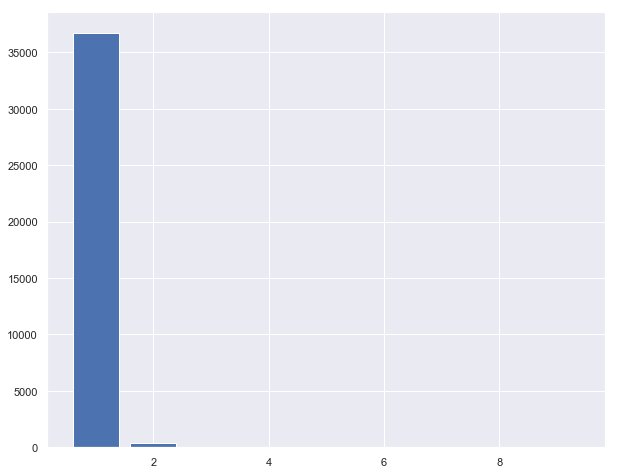

In [105]:
import matplotlib.pyplot as plt

plt.bar(freqdf['range'],freqdf['number of hosts'])

##37100 listings in total, 99% stays in the same neighbourhood(36714), 1% has listings in different neigbhourhoods(386)

## 13.	What are the 5 most used words in reviews that are no stop words? (e.g. the, or, etc. Python can filter these automatically using packages such as NLTK).

In [106]:
listings_detail.neighbourhood_cleansed.isnull().sum() #OK
listings_detail.room_type.isnull().sum() #OK

0

In [107]:
#two-way table ABSOLUTE FREQUENCIES
df= listings_detail[['room_type', 'neighbourhood_cleansed']]
grouped = df.groupby(['neighbourhood_cleansed','room_type'])
grouped.size()


neighbourhood_cleansed      room_type      
Allerton                    Entire home/apt       7
                            Private room         14
                            Shared room           2
Arden Heights               Private room          4
Arrochar                    Entire home/apt      12
                            Private room          3
Arverne                     Entire home/apt      29
                            Private room         43
                            Shared room           2
Astoria                     Entire home/apt     361
                            Private room        458
                            Shared room          18
Bath Beach                  Entire home/apt       7
                            Private room          4
Battery Park City           Entire home/apt      45
                            Private room         13
                            Shared room           1
Bay Ridge                   Entire home/apt      50
                    

In [108]:
newdf= pd.DataFrame(columns=['neighborhood', 'mostPopularRoomType', 'colorcode'])
newdf.neighborhood= df.neighbourhood_cleansed.unique()
newdf.head()


,neighborhood,mostPopularRoomType,colorcode
0,Red Hook,NaN,NaN
1,Battery Park City,NaN,NaN
2,Financial District,NaN,NaN
3,Columbia St,NaN,NaN
4,Mariners Harbor,NaN,NaN


In [109]:
from statistics import mode
for index, row in newdf.iterrows():
    try:
        row['mostPopularRoomType']= mode (df.loc[df['neighbourhood_cleansed'].isin(row[{'neighborhood'}])].room_type)
        if  row['mostPopularRoomType']=='Private room':
            row['colorcode']= 3
        elif row['mostPopularRoomType']=='Entire home/apt':
            row['colorcode']= 2
        elif row['mostPopularRoomType']=='Shared room':
            row['colorcode']= 1
        else :
            print('wrong')
    except:
        row['mostPopularRoomType']= 'no unique mode'
        row['colorcode']= 4

In [110]:
newdf.head()

,neighborhood,mostPopularRoomType,colorcode
0,Red Hook,Entire home/apt,2
1,Battery Park City,Entire home/apt,2
2,Financial District,Entire home/apt,2
3,Columbia St,Entire home/apt,2
4,Mariners Harbor,Private room,3


In [111]:
bins= [1,2,3,4,5]
import folium
from folium import plugins
neighbourhoods_geojson
m = folium.Map([40.730610, -73.935242], zoom_start=10)
folium.Choropleth(
    geo_data=neighbourhoods_geojson,
    name='choropleth',
    data=newdf,
    columns=['neighborhood','colorcode' ],
    key_on='feature.properties.neighbourhood',
     fill_color='Set1',
    fill_opacity=0.8,
    line_opacity=0.2,
    bins=bins,
    legend_name='Most popular room type per neighborhood',    
).add_to(m)

folium.LayerControl().add_to(m)

In [112]:
legend_html =   '''
                <div style="position: absolute; 
                            bottom: 50px; right: 50px; width: 182px; height: 140px; 
                            border:2px solid grey; z-index:9999; font-size:14px;
                            ">&nbsp; Legend <br>
                              &nbsp; Shared room &nbsp; <i class="fa fa-map-marker fa-2x" style="color:red"></i><br>
                              &nbsp; Entire home/apartment &nbsp; <i class="fa fa-map-marker fa-2x" style="color:blue"></i><br>
                              &nbsp; Private room &nbsp; <i class="fa fa-map-marker fa-2x" style="color:green"></i><br>
                              &nbsp; No unique mode &nbsp; <i class="fa fa-map-marker fa-2x" style="color:purple"></i>
                              
                </div>
                ''' 

m.get_root().html.add_child(folium.Element(legend_html))
m

In [113]:
# Open in webbrowser
import webbrowser
m.save('Room type per neighb.html') # Save as html file

webbrowser.open('Room type per neighb.html') # Default browser open

True

In [114]:
listings_detail.neighbourhood_group_cleansed.unique()

array(['Brooklyn', 'Manhattan', 'Staten Island', 'Queens', 'Bronx'],
      dtype=object)

In [116]:
listings_detail.neighbourhood_cleansed.isnull().sum() #OK
listings_detail.room_type.isnull().sum() #OK

#two-way table ABSOLUTE FREQUENCIES
df= listings_detail[['room_type', 'neighbourhood_cleansed']]
grouped = df.groupby(['neighbourhood_cleansed','room_type'])
grouped.size()


newdf= pd.DataFrame(columns=['neighborhood', 'mostPopularRoomType', 'colorcode'])
newdf.neighborhood= df.neighbourhood_cleansed.unique()
newdf.head()


from statistics import mode
for index, row in newdf.iterrows():
    try:
        row['mostPopularRoomType']= mode (df.loc[df['neighbourhood_cleansed'].isin(row[{'neighborhood'}])].room_type)
        if  row['mostPopularRoomType']=='Private room':
            row['colorcode']= 3
        elif row['mostPopularRoomType']=='Entire home/apt':
            row['colorcode']= 2
        elif row['mostPopularRoomType']=='Shared room':
            row['colorcode']= 1
        else :
            print('wrong')
    except:
        row['mostPopularRoomType']= 'no unique mode'
        row['colorcode']= 4

newdf.head()

bins= [1,2,3,4,5]
import folium
from folium import plugins
neighbourhoods_geojson
m = folium.Map([40.730610, -73.935242], zoom_start=10)
folium.Choropleth(
    geo_data=neighbourhoods_geojson,
    name='choropleth',
    data=newdf,
    columns=['neighborhood','colorcode' ],
    key_on='feature.properties.neighbourhood',
     fill_color='Set1',
    fill_opacity=0.8,
    line_opacity=0.2,
    bins=bins,
    legend_name='Most popular room type per neighborhood',    
).add_to(m)

folium.LayerControl().add_to(m)

Legend: 
        RED     Private room
        BLUE    Entire home/apartment
        GREEN   Shared room
        PURPLE  No unique mode 

legend_html =   '''
                <div style="position: absolute; 
                            bottom: 50px; right: 50px; width: 182px; height: 140px; 
                            border:2px solid grey; z-index:9999; font-size:14px;
                            ">&nbsp; Legend <br>
                              &nbsp; Shared room &nbsp; <i class="fa fa-map-marker fa-2x" style="color:red"></i><br>
                              &nbsp; Entire home/apartment &nbsp; <i class="fa fa-map-marker fa-2x" style="color:blue"></i><br>
                              &nbsp; Private room &nbsp; <i class="fa fa-map-marker fa-2x" style="color:green"></i><br>
                              &nbsp; No unique mode &nbsp; <i class="fa fa-map-marker fa-2x" style="color:purple"></i>
                              
                </div>
                ''' 

m.get_root().html.add_child(folium.Element(legend_html))
m

# Open in webbrowser
import webbrowser
m.save('Room type per neighb.html') # Save as html file

webbrowser.open('Room type per neighb.html') # Default browser open

listings_detail.neighbourhood_group_cleansed.unique()

array(['Brooklyn', 'Manhattan', 'Staten Island', 'Queens', 'Bronx'],
      dtype=object)

## 14.	Do these most frequent words differ across neighborhoods? What are the ‘most different’ areas? What distinguishes them? Interpret.

In [117]:
#check which dataframes we have to merge
#listing_id
#reviews_detail.head()
#id
#listings_detail.columns

In [118]:
#merge them based on listing_id and id. 
merger = pd.merge(reviews_detail,
                         listings_detail[['id', 'neighbourhood_group_cleansed', 'neighbourhood_cleansed']],
                         how = 'left', left_on = ['listing_id'], right_on =['id']
                           )



In [119]:
#datacleaning package that we need
# !pip install nltk
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english')) 

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Joran\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Joran\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [120]:
#basic cleaning of merger
merger['comments'] = merger.comments.astype(str).str.lower()
merger = merger[reviews_detail["comments"] != ""]
merger = merger[reviews_detail["comments"] != " "]
merger = merger[reviews_detail["comments"].notnull()]




D:\Anaconda\lib\site-packages\ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """


In [121]:
#remove stopwords and cleaning of merger
merger['comments'] = merger.comments.str.replace("[^\w\s]", "")
merger['comments'] = merger['comments'].str.replace('\d+', '')
merger['comments'] = merger.comments.str.replace("‰Ûª", "''")
merger['comments'] = merger['comments'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))


KeyboardInterrupt: 

In [ ]:
#check the result
#merger['comments']

# Manhattan


In [ ]:
##Manhattan
Manhattan = merger[merger['neighbourhood_group_cleansed'] == 'Manhattan']
Manhattan_reviews = Manhattan['comments']



In [ ]:
# Use text file
f = open("reviews_manhattan.txt","w")
for review in Manhattan_reviews:
     f.writelines(review)
     f.write("\n")
f.close()
        


In [ ]:
#split in words
filename = 'reviews_manhattan.txt'
file = open(filename, 'r')
text_man = file.read()
file.close()
tokens_man = word_tokenize(text_man) ##splits text based on whitespace and punctuations. 


In [ ]:
#check the result
#tokens_man

In [ ]:
#apply stemming 
from nltk.stem import PorterStemmer
clean_man = []
stemmer= PorterStemmer()
for word in tokens_man:
    x = stemmer.stem(word)
    clean_man.append(x)

In [ ]:
## top words manhattan

word_list_man = tokens_man
word_counter_man = {}
for word in word_list_man:
    if word in word_counter_man:
        word_counter_man[word] += 1
    else:
        word_counter_man[word] = 1

popular_words_man = sorted(word_counter_man, key = word_counter_man.get, reverse = True)

top_5_man = popular_words_man[:10]
print(top_5_man)

In [ ]:
##top words manhattan with stemming

word_list_manstem = clean_man
word_counter_manstem = {}
for word in word_list_manstem:
    if word in word_counter_manstem:
        word_counter_manstem[word] += 1
    else:
        word_counter_manstem[word] = 1

word_counter_manstem = sorted(word_counter_manstem, key = word_counter_manstem.get, reverse = True)

top_5_manstem = word_counter_manstem[:5]
print(top_5_manstem)

## this does not give us a clean result. For example: location becomes locat. 
##We will not apply stemming further and use previous result as our final result. 

# Queens

In [ ]:
Queens = merger[merger['neighbourhood_group_cleansed'] == 'Queens']
Queens_reviews = Queens['comments']


In [ ]:
# Use text file
f = open("reviews_queens.txt","w")
for review in Queens_reviews:
     f.writelines(review)
     f.write("\n")
f.close()



In [ ]:
#split in words
filename = 'reviews_queens.txt'
file = open(filename, 'r')
text_queens = file.read()
file.close()
tokens_queens = word_tokenize(text_queens) ##splits text based on whitespace and punctuations. 

In [ ]:
#check the result
#tokens_queens

In [ ]:
## top words Queens

word_list_queens = tokens_queens
word_counter_queens = {}
for word in word_list_queens:
    if word in word_counter_queens:
        word_counter_queens[word] += 1
    else:
        word_counter_queens[word] = 1

popular_words_queens = sorted(word_counter_queens, key = word_counter_queens.get, reverse = True)

top_5 = popular_words_queens[:5]
print(top_5)
        

# Brooklyn

In [ ]:
##Brooklyn
Brooklyn = merger[merger['neighbourhood_group_cleansed'] == 'Brooklyn']
Brooklyn_reviews = Brooklyn['comments']

In [ ]:
# Use text file
f = open("reviews_brooklyn.txt","w")
for review in Brooklyn_reviews:
     f.writelines(review)
     f.write("\n")
f.close()


In [ ]:
#split in words
filename = 'reviews_brooklyn.txt'
file = open(filename, 'r')
text_brook = file.read()
file.close()
tokens_brook = word_tokenize(text_brook) ##splits text based on whitespace and punctuations. 

In [ ]:
#check the result
#tokens_brook

In [ ]:
## top words Brooklyn

word_list_brook = tokens_brook
word_counter_brook = {}
for word in word_list_brook:
    if word in word_counter_brook:
        word_counter_brook[word] += 1
    else:
        word_counter_brook[word] = 1

word_counter_brook = sorted(word_counter_brook, key = word_counter_brook.get, reverse = True)

top_5_brook = word_counter_brook[:5]
print(top_5_brook)

# Staten Island

In [ ]:
##Staten Island
StatenIsland = merger[merger['neighbourhood_group_cleansed'] == 'Staten Island']
Staten_reviews = StatenIsland['comments']

In [ ]:
# Use text file
f = open("reviews_staten.txt","w")
for review in Staten_reviews:
     f.writelines(review)
     f.write("\n")
f.close()

In [ ]:
#split in words
filename = 'reviews_staten.txt'
file = open(filename, 'r')
text_staten = file.read()
file.close()
tokens_staten = word_tokenize(text_staten) ##splits text based on whitespace and punctuations. 

In [ ]:
#check the result
#tokens_staten

In [ ]:
## top words Staten Island

word_list_staten = tokens_staten
word_counter_staten = {}
for word in word_list_staten:
    if word in word_counter_staten:
        word_counter_staten[word] += 1
    else:
        word_counter_staten[word] = 1

word_counter_staten = sorted(word_counter_staten, key = word_counter_staten.get, reverse = True)

top_5_staten = word_counter_staten[:5]
print(top_5_staten)

# Bronx


In [ ]:
Bronx = merger[merger['neighbourhood_group_cleansed'] == 'Bronx']
bronx_reviews = Bronx['comments']

In [ ]:
# Use text file
f = open("reviews_bronx.txt","w")
for review in bronx_reviews:
     f.writelines(review)
     f.write("\n")
f.close()


In [ ]:
#split in words
filename = 'reviews_bronx.txt'
file = open(filename, 'r')
text_bronx = file.read()
file.close()
tokens_bronx = word_tokenize(text_bronx) ##splits text based on whitespace and punctuations. 

In [ ]:
#check the result
#tokens_bronx

In [ ]:
## top words Brooklyn

word_list_bronx = tokens_bronx
word_counter_bronx = {}
for word in word_list_bronx:
    if word in word_counter_bronx:
        word_counter_bronx[word] += 1
    else:
        word_counter_bronx[word] = 1

word_counter_bronx = sorted(word_counter_bronx, key = word_counter_bronx.get, reverse = True)

top_5_bronx = word_counter_bronx[:5]
print(top_5_bronx)

## 15.	Plot the amount of reviews across time. 

In [122]:
data = []
data = reviews_summary.groupby('date').count()['listing_id']

unique_dates = list(data.keys())
counts = list(data)

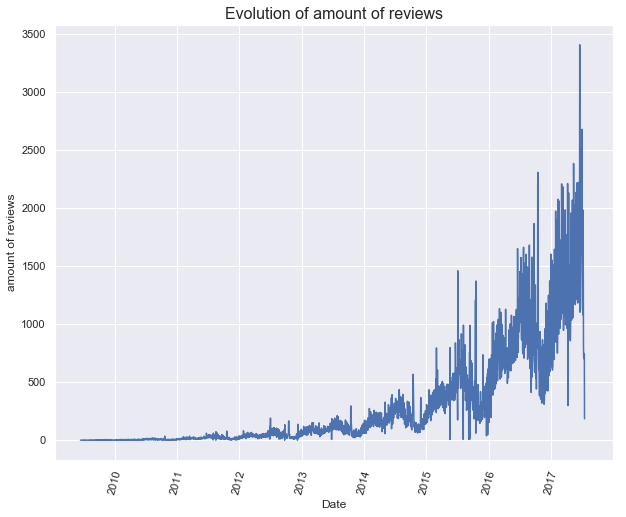

In [123]:
##August 2008 Airbnb started

x = unique_dates
y = counts


plt.plot(x,y)


x_names = ['2010','2011','2012','2013','2014','2015','2016','2017']
y_pos = np.arange(len(x), step = 365)
plt.xticks(y_pos + 200, x_names, rotation = 75)


# naming the x axis 
plt.xlabel('Date') 
# naming the y axis 
plt.ylabel('amount of reviews') 


# giving a title to my graph 
plt.title('Evolution of amount of reviews', fontsize = 16) 
plt.show()
#plt.savefig('foo.png')





## 16.	Is there a link between availability (days per year) with the price? Determine both graphically and statistically. 

In [124]:
calendar_detail.head()

,listing_id,date,available,price
0,2515,2018-10-01,t,$99.00
1,2515,2018-09-30,t,$89.00
2,2515,2018-09-29,t,$99.00
3,2515,2018-09-28,t,$99.00
4,2515,2018-09-27,t,$99.00


In [125]:
clean_dollar(calendar_detail, 'price')

In [126]:
# Set availability to labels
from sklearn.preprocessing import LabelEncoder

In [127]:
calendar_detail['available_num'] = LabelEncoder().fit_transform(calendar_detail['available'])

In [128]:
## Group by listing_id, sum the number of availability = true
agg_dict = {"available_num": np.sum, "price": np.nanmean}

grouped = calendar_detail.groupby("listing_id").agg(agg_dict)

In [129]:
grouped.head()

,available_num,price
listing_id,,
2515,292,90.643837
2539,365,135.468491
2595,363,220.341599
3330,337,70.000000
3647,365,150.000000


In [130]:
# Make a dataframe so the data is easier to handle 
grouped_df = pd.DataFrame({
    'listing_id' : list(grouped.available_num.keys()),
    'n_days_available' : list(grouped.available_num),
    'avg_price' : list(grouped.price)
})

In [131]:
# Drop every record where we have a missing value 
# (Makes no sense to plot when available_num = 0 and price = NaN) 
orig_len = len(grouped_df)
grouped_df = grouped_df[grouped_df['n_days_available'] > 0]
new_len = len(grouped_df)

perc_never_available = 1 - (new_len/orig_len)
perc_never_available

0.3516032222397726

In [132]:
grouped_df = grouped_df.sort_values('n_days_available')
grouped_df.head()

,listing_id,n_days_available,avg_price
36151,18691084,1,70.0
41839,20549878,1,87.0
39341,19760719,1,154.0
18262,9745484,1,115.0
39375,19767346,1,69.0


In [133]:
grouped_df[grouped_df.n_days_available > 365]

,listing_id,n_days_available,avg_price
41641,20483728,386,148.860107
32256,16769880,726,250.000000
10100,5238159,728,70.230766
10492,5565799,730,90.000000


In [134]:
grouped_df = grouped_df[grouped_df.n_days_available <= 365]

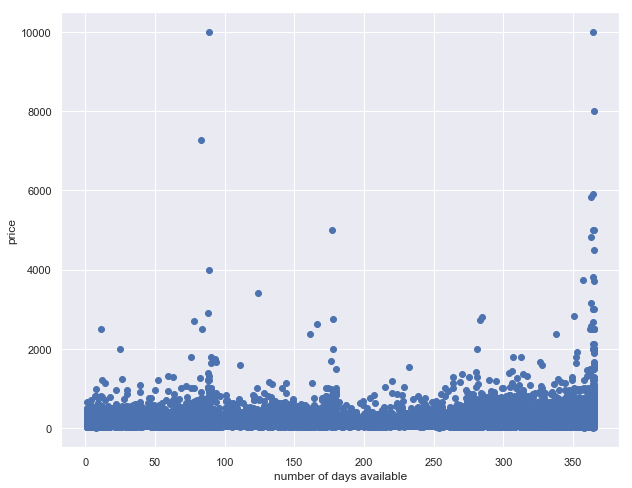

In [135]:
# plot
y = grouped_df.avg_price
X = grouped_df.n_days_available
# x_names = np.arange(max(X), step = 1000)
plt.scatter(X, y)
# plt.xticks(x_names, x_names, rotation = 45)
plt.ylabel('price')
plt.xlabel('number of days available')
plt.show()

In [136]:
# Check if listings_detail has the same problem with listing_ids occurring more than 365 times 
listings_detail[listings_detail['availability_365'] > 365][['availability_30','availability_60', 'availability_90','availability_365']]

,availability_30,availability_60,availability_90,availability_365


Apparently, this seems to be cleaner

In [137]:
clean_dollar(listings_detail, 'price')

already converted


In [138]:
avail_price = listings_detail[['availability_365', 'price']]

In [139]:
avail_price.head()

,availability_365,price
31685,0,245.0
31677,282,210.0
31674,330,142.0
31694,69,90.0
31676,6,125.0


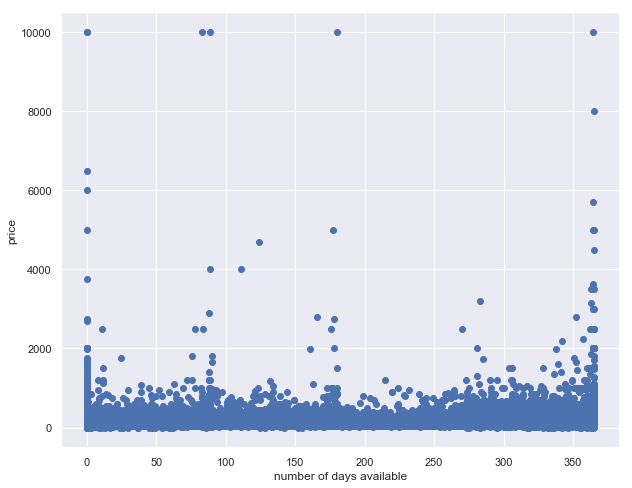

In [140]:
# plot
y = avail_price.price
X = avail_price.availability_365
# x_names = np.arange(max(X), step = 1000)
plt.scatter(X, y)
# plt.xticks(x_names, x_names, rotation = 45)
plt.ylabel('price')
plt.xlabel('number of days available')
plt.show()

There is no clear link.

## 17.	Is there a link between how many times the word ‘great’ appears in a review and the listing price? Determine both graphically and statistically. 

In [141]:
#get an overview of all the reviews
list(reviews_detail.columns)
li_review = reviews_detail.comments.astype(str)
print(len(li_review))

reviews = list(li_review)

reviews[5]


801784


'Helena was gracious and super helpful but hands off and let us enjoy her beautiful apt. Great view, great host, tons of stuff to do in the surrounding area and the most simple process. We had a great time and I would recommend booking with her. I might even book again one day. '

In [142]:
#amount of great in strings. 

amount_great = []
x=0
b=0
substring1 = "great"
substring2 = " grate "   ##check some typos that we found back as well. and add space, to not include grateful. 
for i in range(0,len(reviews)):
    if type(reviews[i]) == int:
        amount_great.append(0)
        continue
    elif len(reviews[i]) > 4:
        x = reviews[i].lower().count(substring1)
        b = reviews[i].lower().count(substring2)
        amount_great.append(x+b)
    else:
        amount_great.append(0)
        continue 

amount_great

[2,
 1,
 2,
 0,
 1,
 3,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 2,
 1,
 0,
 1,
 1,
 0,
 1,
 2,
 1,
 1,
 2,
 0,
 0,
 0,
 0,
 0,
 2,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 2,
 2,
 3,
 2,
 2,
 0,
 0,
 0,
 0,
 2,
 0,
 1,
 3,
 0,
 0,
 2,
 0,
 1,
 0,
 2,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 2,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 2,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 2,
 1,
 0,
 1,
 0,
 1,
 3,
 0,
 1,
 0,
 4,
 0,
 0,
 0,
 1,
 0,
 2,
 0,
 0,
 2,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 3,
 0,
 1,
 2,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 2,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 2,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,


In [143]:
reviews_detail.id 
id_list = []
id_list = list(reviews_detail.id)

id_list


[58944174,
 59446510,
 59557387,
 62664325,
 63410004,
 66275129,
 68607539,
 70009847,
 70385596,
 70855836,
 71406983,
 72236093,
 74459903,
 75632798,
 82135739,
 89330491,
 143257211,
 161073018,
 161325506,
 163422462,
 171049855,
 176744541,
 186457387,
 40727422,
 41774263,
 43369054,
 48338093,
 57455587,
 106977097,
 148445440,
 197039478,
 3769510,
 4860228,
 5487556,
 7050079,
 33008455,
 33843839,
 39826076,
 40633637,
 41043061,
 41622573,
 44466395,
 45314172,
 46590592,
 47351475,
 47745014,
 50294377,
 51435484,
 53410570,
 54644203,
 55741233,
 56530731,
 58546369,
 59783442,
 60903464,
 61743103,
 65332228,
 67281574,
 68627595,
 70845657,
 71417306,
 73347855,
 73811453,
 75322479,
 77928713,
 79965980,
 83007425,
 83867556,
 85714578,
 87303455,
 88577078,
 89487054,
 91874481,
 95694744,
 101209724,
 101480976,
 101885684,
 102995859,
 103275837,
 103453252,
 104774734,
 104805569,
 109439093,
 110475615,
 112596525,
 113131577,
 113685786,
 114887766,
 115709685,


In [144]:
listings_summary.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,18461891,"Bright, comfortable 1B studio near everything!",916092,Connie Mae,Queens,Ditmars Steinway,40.774142,-73.916246,Entire home/apt,110,6,0,NaN,NaN,1,0
1,20702398,Quiet house on City Island,1457680,James,Bronx,City Island,40.849191,-73.786509,Private room,50,1,2,2017-10-01,2.00,1,169
2,6627449,Large 1 BDRM in Great location,13886510,Arlene,Bronx,City Island,40.849775,-73.786609,Entire home/apt,125,3,21,2017-09-26,0.77,1,363
3,19949243,Stay aboard a sailboat,1149260,MoMo,Bronx,City Island,40.848838,-73.782276,Entire home/apt,100,3,0,NaN,NaN,1,90
4,1886820,Quaint City Island Community.,9815788,Steve,Bronx,City Island,40.841144,-73.783052,Entire home/apt,300,7,0,NaN,NaN,1,365


In [147]:
reviews_great = pd.DataFrame({"reviews" : li_review, "amount_great": amount_great, "id": id_list})

In [148]:
result_great = pd.merge(reviews_great,
                         listings_summary[['id', 'price']],
                         on='id')


In [149]:
result_great.sort_values(by=['price'], inplace=True)




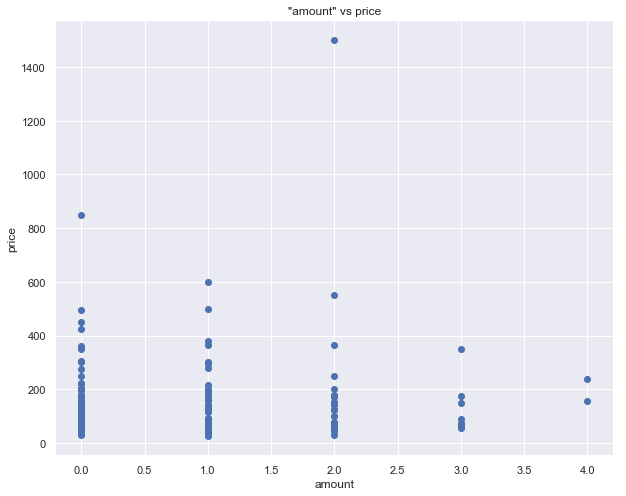

In [150]:

x = result_great.price
y = result_great.amount_great


plt.scatter(y,x)

# naming the x axis 
plt.xlabel('amount') 
# naming the y axis 
plt.ylabel('price') 


# giving a title to my graph 
plt.title('"amount" vs price') 
plt.show()

## 18.	Plot how the number of Airbnb locations are distributed across the city on a map. Plot the number of locations per neighborhood and color code according to neighborhood group.

### 18.1 Distribution of locations across New York 

In [151]:
import pandas as pd
import folium

In [152]:
#grab a random sample from df
subset_of_df = listings_detail.sample(n=2000)
some_map = folium.Map([40.730610, -73.935242], zoom_start=10)
#creating a Marker for each point in df_sample. Each point will get a popup with their zip
for row in subset_of_df.itertuples():
    some_map.add_child(folium.Marker(location=[row.latitude,row.longitude],
           popup=row.name))
some_map

In [153]:
from folium.plugins import MarkerCluster
some_map = folium.Map([40.730610, -73.935242], zoom_start=10)
mc = MarkerCluster()
#creating a Marker for each point in df_sample. Each point will get a popup with their zip
for row in subset_of_df.itertuples():
    mc.add_child(folium.Marker(location=[row.latitude,  row.longitude],
                 popup=row.name))
 
some_map.add_child(mc)
some_map

In [154]:
folium.Choropleth(
    geo_data=neighbourhoods_geojson,
    name='choropleth',
    key_on='feature.properties.neighbourhood_group',
    fill_opacity=0.1,
    fill_color='Yellow',
    line_opacity=0.4
).add_to(some_map)

folium.LayerControl().add_to(some_map)
some_map

In [155]:
# Open in webbrowser
import webbrowser
some_map.save('distributie.html') # Save as html file

webbrowser.open('distributie.html') # Default browser open

True

### 18.2 Heat map of number of locations over New York across time 

In [156]:
cal_det_available = calendar_detail[calendar_detail['available'] == 't']
try: 
    cal_det_available['price'] = cal_det_available['price'].str.replace("$","")
    cal_det_available['price'] = cal_det_available['price'].str.replace(",","")
    cal_det_available.price = pd.to_numeric(cal_det_available.price, downcast = 'float')
except: 
    print("Already converted")

cal_det_available.head(10)

Already converted


,listing_id,date,available,price,available_num
0,2515,2018-10-01,t,99.0,1
1,2515,2018-09-30,t,89.0,1
2,2515,2018-09-29,t,99.0,1
3,2515,2018-09-28,t,99.0,1
4,2515,2018-09-27,t,99.0,1
5,2515,2018-09-26,t,99.0,1
6,2515,2018-09-25,t,99.0,1
7,2515,2018-09-24,t,99.0,1
8,2515,2018-09-23,t,99.0,1
9,2515,2018-09-22,t,99.0,1


In [157]:
cal_det_available['month'] = cal_det_available['date'].str.slice(start = 5, stop = 7)
listings_detail_needed = listings_detail[["id","latitude", "longitude"]]
listings_detail_needed.rename(columns={"id":"listing_id"}, inplace = True)
listing_date_neighbourhood = pd.merge(cal_det_available,listings_detail_needed, how = "left", on = "listing_id")

D:\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
D:\Anaconda\lib\site-packages\pandas\core\frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


In [158]:
calendar_detail.columns

Index(['listing_id', 'date', 'available', 'price', 'available_num'], dtype='object')

In [159]:
df_calendar= calendar_detail[["listing_id", "date"]]
listings_detail_needed = listings_detail[["id","latitude", "longitude", "price"]]
listings_detail_needed.rename(columns={"id":"listing_id"}, inplace = True)
df_calendar.head()

price_per_date=df_calendar.merge(listings_detail_needed, on="listing_id")
price_per_date.head()

,listing_id,date,latitude,longitude,price
0,2515,2018-10-01,40.799205,-73.953676,59.0
1,2515,2018-09-30,40.799205,-73.953676,59.0
2,2515,2018-09-29,40.799205,-73.953676,59.0
3,2515,2018-09-28,40.799205,-73.953676,59.0
4,2515,2018-09-27,40.799205,-73.953676,59.0


In [160]:
from folium import plugins

map_hooray = folium.Map([40.730610, -73.935242], zoom_start=10)

# Create weight column, using date
heat_df['Weight'] = price_per_date['date'].str[5:7]
heat_df['Weight'] = heat_df['Weight'].astype(float)
heat_df = heat_df.dropna(axis=0, subset=['latitude','longitude', 'Weight'])

# List comprehension to make out list of lists
heat_data = [[[row['latitude'],row['longitude']] for index, row in heat_df[heat_df['Weight'] == i].iterrows()] for i in range(0,13)]

# Plot it on the map
hm = plugins.HeatMapWithTime(heat_data,auto_play=True,max_opacity=0.8)
hm.add_to(map_hooray)
# Display the map
map_hooray

### 18.3 Number of locations per neighborhood and color coded according neighborhood group 

In [161]:
#!pip install folium
import folium
from folium import plugins
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from folium.plugins import HeatMap

%matplotlib inline
m= folium.Map([40.730610, -73.935242], zoom_start=10)

In [162]:
lat= pd.to_numeric(listings_detail["latitude"],errors='coerce')
long= pd.to_numeric(listings_detail["longitude"],errors='coerce')
listings_detail["longitude"]=pd.to_numeric(listings_detail["longitude"],errors='coerce')
listings_detail["latitude"]=pd.to_numeric(listings_detail["latitude"],errors='coerce')
heat_df = listings_detail[['latitude', 'longitude']]

listings_detail["latitude"].head()


31685    40.680392
31677    40.678604
31674    40.678514
31694    40.677922
31676    40.676111
Name: latitude, dtype: float64

In [163]:
try :
    listings_detail["price"].head()
    listings_detail['price'] = listings_detail['price'].str.replace("$","")
    listings_detail['price'] = listings_detail['price'].str.replace(",","")
    listings_detail.price = pd.to_numeric(listings_detail.price, downcast = 'float')
    counts=listings_detail.price 
    listings_detail["price"].head()
except:
    print("Already done")

Already done


In [164]:
#two-way table ABSOLUTE FREQUENCIES
df= listings_detail[[ 'neighbourhood_cleansed']]
grouped = df.groupby([ 'neighbourhood_cleansed'])
#grouped.size()


In [165]:
lon=listings_detail.groupby('neighbourhood_cleansed').mean()['longitude']

neighbLonDf= pd.DataFrame({'neighbourhood': list(lon.keys()) , 'longitude': list(lon)})
neighbLonDf.head()

,neighbourhood,longitude
0,Allerton,-73.862475
1,Arden Heights,-74.168888
2,Arrochar,-74.069192
3,Arverne,-73.794337
4,Astoria,-73.920374


In [166]:
lat=listings_detail.groupby('neighbourhood_cleansed').mean()['latitude']

neighbLatDf= pd.DataFrame({'neighbourhood': list(lat.keys()) , 'latitude': list(lat)})
neighbLatDf.head()

,neighbourhood,latitude
0,Allerton,40.863807
1,Arden Heights,40.551053
2,Arrochar,40.593686
3,Arverne,40.591449
4,Astoria,40.764237


In [167]:
column_neighb= grouped.count()
column_neighb.shape

(217, 0)

In [168]:
newdf= pd.DataFrame(columns=['neighbourhood', 'count'])
newdf.neighbourhood= df.neighbourhood_cleansed.unique()
newdf=newdf.sort_values(by='neighbourhood')
newdf=newdf.reset_index()
newdf=newdf.drop(columns=['index'])
newdf.shape

for index, row in newdf.iterrows():
    row['count']= grouped.size()[index]
    
newdf.head()

,neighbourhood,count
0,Allerton,23
1,Arden Heights,4
2,Arrochar,15
3,Arverne,74
4,Astoria,837


In [ ]:
totalDf= newdf.merge(neighbLatDf, on='neighbourhood')
totalDf= totalDf.merge(neighbLonDf, on='neighbourhood' )
totalDf= totalDf.merge(neighbourhoods, on='neighbourhood' )
totalDf.head()

In [171]:
def color(row):
    if row.neighbourhood_group == 'Queens':
                              return 'green' 
    elif row.neighbourhood_group == 'Brooklyn' :
                              return 'red'
    elif row.neighbourhood_group == 'Staten Island' :
                              return 'orange'
    elif row.neighbourhood_group == 'Bronx' :
                              return 'blue'
    else:
                              return'purple'


In [ ]:
m = folium.Map([40.730610, -73.935242], zoom_start=10)
#creating a Marker for each point in df_sample. Each point will get a popup with their zip

folium.Choropleth(
    geo_data=neighbourhoods_geojson,
    name='choropleth',
    key_on='feature.properties.neighbourhood',
    fill_opacity=0.1
).add_to(m)

folium.LayerControl().add_to(m)

for row in totalDf.itertuples():
    m.add_child(folium.Marker([row.latitude,
                                      row.longitude], popup=row.count,
                                     icon=folium.Icon(color=color(row), 
                                                      prefix='fa', icon='circle')))


In [ ]:
legend_html =   '''
                <div style="position: absolute; 
                            bottom: 50px; right: 50px; width: 140px; height: 190px; 
                            border:2px solid grey; z-index:9999; font-size:14px;
                            ">&nbsp; Legend <br>
                              &nbsp; Queens &nbsp; <i class="fa fa-map-marker fa-2x" style="color:green"></i><br>
                              &nbsp; Staten Island &nbsp; <i class="fa fa-map-marker fa-2x" style="color:orange"></i><br>
                              &nbsp; Bronx &nbsp; <i class="fa fa-map-marker fa-2x" style="color:blue"></i><br>
                              &nbsp; Manhattan &nbsp; <i class="fa fa-map-marker fa-2x" style="color:purple"></i><br>
                              &nbsp; Brooklyn &nbsp; <i class="fa fa-map-marker fa-2x" style="color:red"></i>
                </div>
                ''' 

m.get_root().html.add_child(folium.Element(legend_html))
m

In [ ]:
df2= listings_detail[['neighbourhood_group_cleansed']]
grouped2 = df2.groupby(['neighbourhood_group_cleansed'])

grouped2.size()

In [ ]:
neighbourhood_groups = pd.DataFrame( {
    'neighbourhood_group': ['Bronx','Queens', 'Brooklyn', 'Staten Island', 'Manhattan'],
    'lat':[40.837048, 40.742054,40.650002,40.579021,40.758896],
    'long': [-73.865433, -73.769417,-73.949997,-74.151535,-73.985130]
})
neighbourhood_groups.head()

In [ ]:
newdf2= pd.DataFrame(columns=['neighbourhood_group', 'Count_'])
newdf2.neighbourhood_group= df2.neighbourhood_group_cleansed.unique()
newdf2=newdf2.sort_values(by='neighbourhood_group')
newdf2=newdf2.reset_index()
newdf2=newdf2.drop(columns=['index'])
newdf2.shape

#newdf.sort_values
for index, row in newdf2.iterrows():
    row['Count_']= grouped2.size()[index]
    
newdf2.head()

In [ ]:
groups_df= neighbourhood_groups.merge(newdf2, on='neighbourhood_group')
groups_df

In [ ]:

#creating a Marker for each point in df_sample. Each point will get a popup with their zip
for row in groups_df.itertuples():
    string= row.neighbourhood_group+": "+str(row.Count_)
    m.add_child(folium.Marker([row.lat,
         row.long],icon=folium.Icon(color='black'), popup=string))
m
                                            

In [ ]:
# Open in webbrowser
import webbrowser
m.save('Count per neighb.html') # Save as html file

webbrowser.open('Count per neighb.html') # Default browser open

## 19.	Williamsburg is a ‘hip’ area in in Brooklyn with a lot of Airbnb locations on offer. Explore how this area differs from other locations and visualize. You may also use external data sources.

In [173]:
listings_detail.groupby('neighbourhood_group_cleansed').quantile(.25)['price']

neighbourhood_group_cleansed
Bronx            47.0
Brooklyn         60.0
Manhattan        90.0
Queens           55.0
Staten Island    52.0
Name: price, dtype: float64

In [174]:
Williams_bruh = listings_detail[listings_detail.neighbourhood_cleansed == 'Williamsburg']

In [175]:
Williams_bruh.property_type.value_counts()

Apartment             3401
Loft                   294
House                  102
Condominium             60
Townhouse               31
Other                   19
Guest suite              4
Bed & Breakfast          2
Timeshare                2
Serviced apartment       1
Earth House              1
Chalet                   1
Train                    1
Guesthouse               1
Name: property_type, dtype: int64

In [176]:
grouped = listings_detail.groupby('neighbourhood_cleansed').count()['id']
grouped_df = pd.DataFrame({
    'neigh' : list(grouped.keys()),
    'counts' : list(grouped)
})
grouped_df = grouped_df.sort_values('counts', ascending = False)
grouped_df.head(5)

,neigh,counts
211,Williamsburg,3920
13,Bedford-Stuyvesant,3178
93,Harlem,2623
26,Bushwick,2203
62,East Village,1961


In [177]:
(1 + 1 == 2) or (1 + 1 == 3)

True

In [178]:
subgroup_df = listings_detail[(listings_detail['neighbourhood_cleansed'] == 'Williamsburg')
                             | (listings_detail['neighbourhood_cleansed'] == 'Bedford-Stuyvesant')
                             | (listings_detail['neighbourhood_cleansed'] == 'Harlem')
                             | (listings_detail['neighbourhood_cleansed'] == 'Bushwick')
                             | (listings_detail['neighbourhood_cleansed'] == 'East Village')]

In [179]:
subgroup_df.groupby('neighbourhood_cleansed').count()['property_type']

crosstab = pd.crosstab(index = subgroup_df['property_type'], columns = subgroup_df['neighbourhood_cleansed'])

In [180]:
crosstab = crosstab.sort_values('Williamsburg', ascending = False)
crosstab

neighbourhood_cleansed,Bedford-Stuyvesant,Bushwick,East Village,Harlem,Williamsburg
property_type,,,,,
Apartment,2522,1861,1877,2373,3401
Loft,56,98,20,9,294
House,390,145,15,96,102
Condominium,23,9,19,31,60
Townhouse,137,61,12,80,31
Other,21,17,8,11,19
Guest suite,5,2,1,0,4
Timeshare,0,0,0,0,2
Bed & Breakfast,7,3,3,13,2


In [181]:
columns = ['Bedford-Stuyvesant', 'Bushwick','East Village', 'Harlem', 'Williamsburg' ]
crosstab_normalized = crosstab
for column in columns:
    crosstab_normalized[column] = crosstab_normalized[column].apply(lambda x : x/sum(crosstab_normalized[column]))

In [182]:
crosstab_normalized

neighbourhood_cleansed,Bedford-Stuyvesant,Bushwick,East Village,Harlem,Williamsburg
property_type,,,,,
Apartment,0.793581,0.844757,0.957165,0.904689,0.867602
Loft,0.017621,0.044485,0.010199,0.003431,0.075000
House,0.122719,0.065819,0.007649,0.036599,0.026020
Condominium,0.007237,0.004085,0.009689,0.011819,0.015306
Townhouse,0.043109,0.027690,0.006119,0.030499,0.007908
Other,0.006608,0.007717,0.004080,0.004194,0.004847
Guest suite,0.001573,0.000908,0.000510,0.000000,0.001020
Timeshare,0.000000,0.000000,0.000000,0.000000,0.000510
Bed & Breakfast,0.002203,0.001362,0.001530,0.004956,0.000510


In [183]:
import seaborn as sns
figure(num=None, figsize=(10, 6))

lofttab = crosstab_normalized[crosstab_normalized.Bushwick.keys() == 'Loft']


<Figure size 720x432 with 0 Axes>

In [186]:
float(lofttab.Harlem)

0.003431185665268776

In [187]:
neighs = ['Bedford-Stuyvesant', 'Bushwick','East Village', 'Harlem', 'Williamsburg']
loft_numbers = []
for column in neighs: 
    loft_numbers.append(float(lofttab[column]))

In [188]:
loft_numbers

[0.01762114537444934,
 0.04448479346345892,
 0.010198878123406425,
 0.003431185665268776,
 0.075]

<BarContainer object of 5 artists>

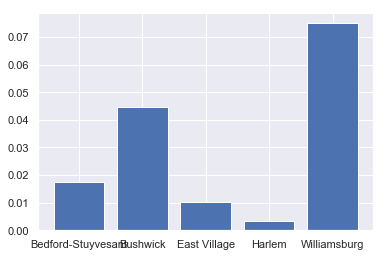

In [189]:
plt.bar(neighs, loft_numbers)

In [190]:
features = ['Apartment', 'Loft', 'House', 'Condominium','Townhouse', 'Timeshare','Train', 'Chalet', 'Earth House']



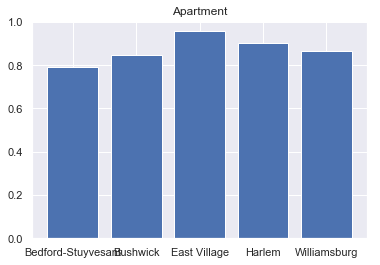

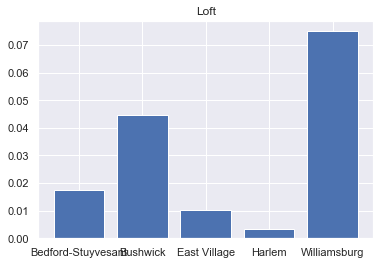

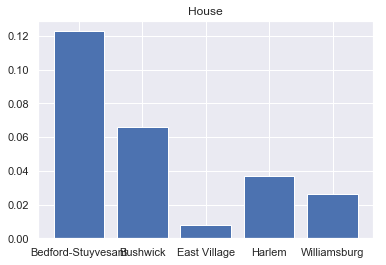

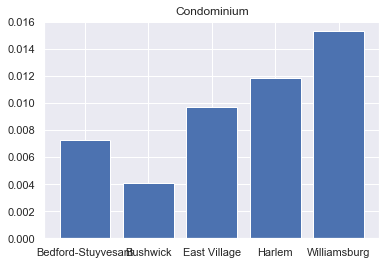

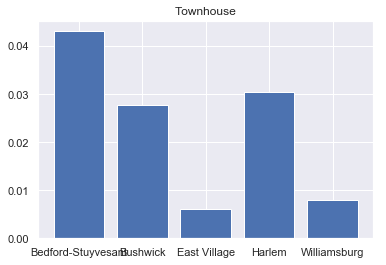

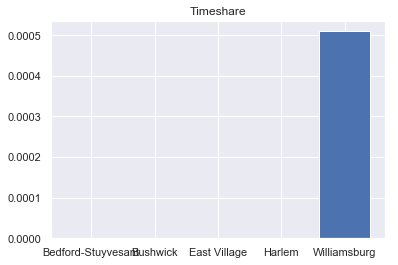

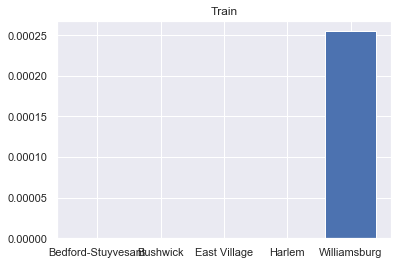

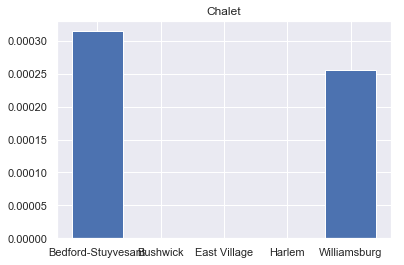

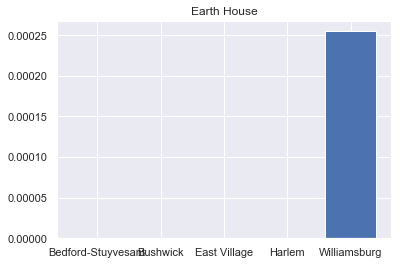

In [191]:
for feature in features: 
    lofttab = crosstab_normalized[crosstab_normalized.Bushwick.keys() == feature]
    neighs = ['Bedford-Stuyvesant', 'Bushwick','East Village', 'Harlem', 'Williamsburg']
    loft_numbers = []
    for column in neighs: 
        loft_numbers.append(float(lofttab[column]))
    plt.title(feature)
    plt.bar(neighs, loft_numbers)
    plt.show()

## 20.	Create a stacked bar chart of the distribution of room type per neighborhood group. Statistically test whether these differences are significant.

In [192]:
listings_detail.neighbourhood_group_cleansed.unique()

array(['Brooklyn', 'Manhattan', 'Staten Island', 'Queens', 'Bronx'],
      dtype=object)

In [193]:
listings_detail.room_type.unique()

array(['Entire home/apt', 'Private room', 'Shared room'], dtype=object)

In [194]:
#two-way table ABSOLUTE FREQUENCIES
df= listings_detail[['room_type', 'neighbourhood_group_cleansed']]
grouped = df.groupby(['neighbourhood_group_cleansed','room_type'])
grouped.size()

neighbourhood_group_cleansed  room_type      
Bronx                         Entire home/apt      221
                              Private room         532
                              Shared room           38
Brooklyn                      Entire home/apt     8308
                              Private room        9805
                              Shared room          357
Manhattan                     Entire home/apt    11802
                              Private room        8002
                              Shared room          566
Queens                        Entire home/apt     1605
                              Private room        2613
                              Shared room          174
Staten Island                 Entire home/apt      136
                              Private room         158
dtype: int64

In [195]:
df.head()

,room_type,neighbourhood_group_cleansed
31685,Entire home/apt,Brooklyn
31677,Entire home/apt,Brooklyn
31674,Entire home/apt,Brooklyn
31694,Private room,Brooklyn
31676,Entire home/apt,Brooklyn


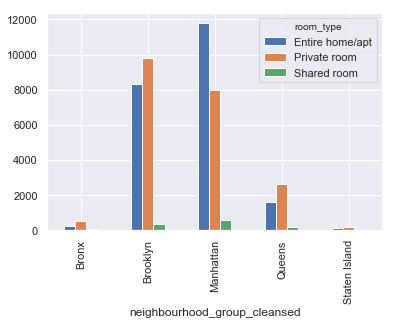

In [196]:
my_tab = pd.crosstab(index = listings_detail["neighbourhood_group_cleansed"],  # Make a crosstab
                              columns=listings_detail["room_type"])      # Name the count column

my_tab.plot.bar()

In [197]:
my_tab.head()

room_type,Entire home/apt,Private room,Shared room
neighbourhood_group_cleansed,,,
Bronx,221,532,38
Brooklyn,8308,9805,357
Manhattan,11802,8002,566
Queens,1605,2613,174
Staten Island,136,158,0


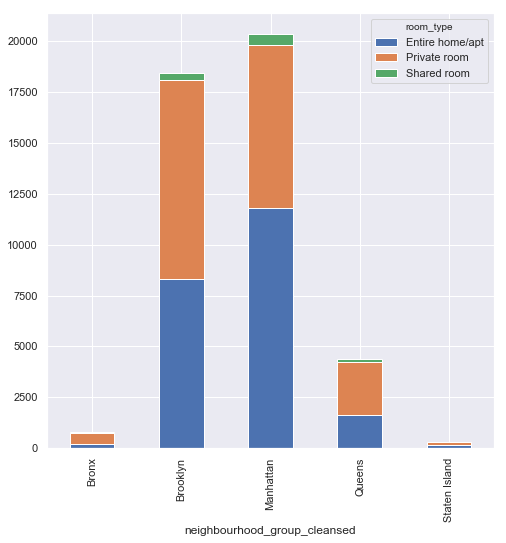

In [198]:
#ABSOLUTE FREQUENCIES

color_table = pd.crosstab(index=df["neighbourhood_group_cleansed"], 
                          columns=df["room_type"])
color_table.plot(kind="bar", 
                 figsize=(8,8),
                 stacked=True)

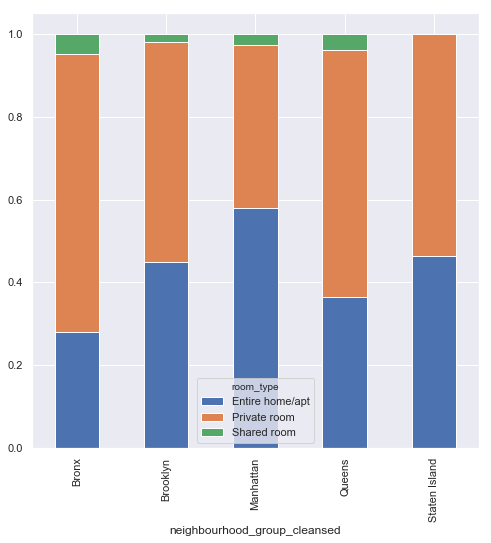

In [199]:
#RELATIVE FREQUENCIES
color_table = pd.crosstab(index=df["neighbourhood_group_cleansed"], 
                          columns=df["room_type"],normalize='index')
color_table.plot(kind="bar", 
                 figsize=(8,8),
                 stacked=True)

In [200]:
color_table.head() # relative frequencies

room_type,Entire home/apt,Private room,Shared room
neighbourhood_group_cleansed,,,
Bronx,0.279393,0.672566,0.048040
Brooklyn,0.449811,0.530861,0.019329
Manhattan,0.579381,0.392833,0.027786
Queens,0.365437,0.594945,0.039617
Staten Island,0.462585,0.537415,0.000000


In [201]:
from scipy.stats import chi2_contingency
from scipy.stats import chi2
stat, p, dof, expected = chi2_contingency(color_table)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
	print('Dependent (reject H0)')
else:
	print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
	print('Dependent (reject H0)')
else:
	print('Independent (fail to reject H0)')

dof=8
[[0.42732146 0.54572403 0.02695451]
 [0.42732146 0.54572403 0.02695451]
 [0.42732146 0.54572403 0.02695451]
 [0.42732146 0.54572403 0.02695451]
 [0.42732146 0.54572403 0.02695451]]
probability=0.950, critical=15.507, stat=0.247
Independent (fail to reject H0)
significance=0.050, p=1.000
Independent (fail to reject H0)


# 21.	Color-coded plot the most popular room type per neighborhood on a city map.

In [202]:
listings_detail.neighbourhood_cleansed.isnull().sum() #OK
listings_detail.room_type.isnull().sum() #OK

0

In [203]:
#two-way table ABSOLUTE FREQUENCIES
df= listings_detail[['room_type', 'neighbourhood_cleansed']]
grouped = df.groupby(['neighbourhood_cleansed','room_type'])
grouped.size()


neighbourhood_cleansed      room_type      
Allerton                    Entire home/apt       7
                            Private room         14
                            Shared room           2
Arden Heights               Private room          4
Arrochar                    Entire home/apt      12
                            Private room          3
Arverne                     Entire home/apt      29
                            Private room         43
                            Shared room           2
Astoria                     Entire home/apt     361
                            Private room        458
                            Shared room          18
Bath Beach                  Entire home/apt       7
                            Private room          4
Battery Park City           Entire home/apt      45
                            Private room         13
                            Shared room           1
Bay Ridge                   Entire home/apt      50
                    

In [204]:
newdf= pd.DataFrame(columns=['neighborhood', 'mostPopularRoomType', 'colorcode'])
newdf.neighborhood= df.neighbourhood_cleansed.unique()
newdf.head()


,neighborhood,mostPopularRoomType,colorcode
0,Red Hook,NaN,NaN
1,Battery Park City,NaN,NaN
2,Financial District,NaN,NaN
3,Columbia St,NaN,NaN
4,Mariners Harbor,NaN,NaN


In [205]:
from statistics import mode
for index, row in newdf.iterrows():
    try:
        row['mostPopularRoomType']= mode (df.loc[df['neighbourhood_cleansed'].isin(row[{'neighborhood'}])].room_type)
        if  row['mostPopularRoomType']=='Private room':
            row['colorcode']= 3
        elif row['mostPopularRoomType']=='Entire home/apt':
            row['colorcode']= 2
        elif row['mostPopularRoomType']=='Shared room':
            row['colorcode']= 1
        else :
            print('wrong')
    except:
        row['mostPopularRoomType']= 'no unique mode'
        row['colorcode']= 4

In [206]:
newdf.head()

,neighborhood,mostPopularRoomType,colorcode
0,Red Hook,Entire home/apt,2
1,Battery Park City,Entire home/apt,2
2,Financial District,Entire home/apt,2
3,Columbia St,Entire home/apt,2
4,Mariners Harbor,Private room,3


In [207]:
bins= [1,2,3,4,5]
import folium
from folium import plugins
neighbourhoods_geojson
m = folium.Map([40.730610, -73.935242], zoom_start=10)
folium.Choropleth(
    geo_data=neighbourhoods_geojson,
    name='choropleth',
    data=newdf,
    columns=['neighborhood','colorcode' ],
    key_on='feature.properties.neighbourhood',
     fill_color='Set1',
    fill_opacity=0.8,
    line_opacity=0.2,
    bins=bins,
    legend_name='Most popular room type per neighborhood',    
).add_to(m)

folium.LayerControl().add_to(m)

In [208]:
legend_html =   '''
                <div style="position: absolute; 
                            bottom: 50px; right: 50px; width: 182px; height: 140px; 
                            border:2px solid grey; z-index:9999; font-size:14px;
                            ">&nbsp; Legend <br>
                              &nbsp; Shared room &nbsp; <i class="fa fa-map-marker fa-2x" style="color:red"></i><br>
                              &nbsp; Entire home/apartment &nbsp; <i class="fa fa-map-marker fa-2x" style="color:blue"></i><br>
                              &nbsp; Private room &nbsp; <i class="fa fa-map-marker fa-2x" style="color:green"></i><br>
                              &nbsp; No unique mode &nbsp; <i class="fa fa-map-marker fa-2x" style="color:purple"></i>
                              
                </div>
                ''' 

m.get_root().html.add_child(folium.Element(legend_html))
m

In [209]:
# Open in webbrowser
import webbrowser
m.save('Room type per neighb.html') # Save as html file

webbrowser.open('Room type per neighb.html') # Default browser open

True

In [210]:
listings_detail.neighbourhood_group_cleansed.unique()

array(['Brooklyn', 'Manhattan', 'Staten Island', 'Queens', 'Bronx'],
      dtype=object)

In [212]:
listings_detail.neighbourhood_cleansed.isnull().sum() #OK
listings_detail.room_type.isnull().sum() #OK

#two-way table ABSOLUTE FREQUENCIES
df= listings_detail[['room_type', 'neighbourhood_cleansed']]
grouped = df.groupby(['neighbourhood_cleansed','room_type'])
grouped.size()


newdf= pd.DataFrame(columns=['neighborhood', 'mostPopularRoomType', 'colorcode'])
newdf.neighborhood= df.neighbourhood_cleansed.unique()
newdf.head()


from statistics import mode
for index, row in newdf.iterrows():
    try:
        row['mostPopularRoomType']= mode (df.loc[df['neighbourhood_cleansed'].isin(row[{'neighborhood'}])].room_type)
        if  row['mostPopularRoomType']=='Private room':
            row['colorcode']= 3
        elif row['mostPopularRoomType']=='Entire home/apt':
            row['colorcode']= 2
        elif row['mostPopularRoomType']=='Shared room':
            row['colorcode']= 1
        else :
            print('wrong')
    except:
        row['mostPopularRoomType']= 'no unique mode'
        row['colorcode']= 4

newdf.head()

bins= [1,2,3,4,5]
import folium
from folium import plugins
neighbourhoods_geojson
m = folium.Map([40.730610, -73.935242], zoom_start=10)
folium.Choropleth(
    geo_data=neighbourhoods_geojson,
    name='choropleth',
    data=newdf,
    columns=['neighborhood','colorcode' ],
    key_on='feature.properties.neighbourhood',
     fill_color='Set1',
    fill_opacity=0.8,
    line_opacity=0.2,
    bins=bins,
    legend_name='Most popular room type per neighborhood',    
).add_to(m)

folium.LayerControl().add_to(m)

Legend: 
        RED     Private room
        BLUE    Entire home/apartment
        GREEN   Shared room
        PURPLE  No unique mode 

legend_html =   '''
                <div style="position: absolute; 
                            bottom: 50px; right: 50px; width: 182px; height: 140px; 
                            border:2px solid grey; z-index:9999; font-size:14px;
                            ">&nbsp; Legend <br>
                              &nbsp; Shared room &nbsp; <i class="fa fa-map-marker fa-2x" style="color:red"></i><br>
                              &nbsp; Entire home/apartment &nbsp; <i class="fa fa-map-marker fa-2x" style="color:blue"></i><br>
                              &nbsp; Private room &nbsp; <i class="fa fa-map-marker fa-2x" style="color:green"></i><br>
                              &nbsp; No unique mode &nbsp; <i class="fa fa-map-marker fa-2x" style="color:purple"></i>
                              
                </div>
                ''' 

m.get_root().html.add_child(folium.Element(legend_html))
m

# Open in webbrowser
import webbrowser
m.save('Room type per neighb.html') # Save as html file

webbrowser.open('Room type per neighb.html') # Default browser open

listings_detail.neighbourhood_group_cleansed.unique()

array(['Brooklyn', 'Manhattan', 'Staten Island', 'Queens', 'Bronx'],
      dtype=object)

# House easter egg

Side note: the turtle package seems to kill your kernel so we believe that it wasn't really programmed in the most efficient way. Anyway, have fun creating your own AirBnb place with it. :)


In [213]:
import turtle
import math

# Set the background color
screen = turtle.Screen()
screen.bgcolor("skyblue")

# Create our turtle
george = turtle.Turtle()
george.color("black")
george.shape("turtle")
george.speed(10)

# Define a funtion to draw and fill a rectangle with the given
# dimensions and color
def drawRectangle(t, width, height, color):
  t.fillcolor(color)
  t.begin_fill()
  t.forward(width)
  t.left(90)
  t.forward(height)
  t.left(90)
  t.forward(width)
  t.left(90)
  t.forward(height)
  t.left(90)
  t.end_fill()
  
# Define a function to draw and fill an equalateral right 
# triangle with the given hypotenuse length and color.  This
# is used to create a roof shape.
def drawTriangle(t, length, color):
  t.fillcolor(color)
  t.begin_fill()
  t.forward(length)
  t.left(135)
  t.forward(length / math.sqrt(2))
  t.left(90)
  t.forward(length / math.sqrt(2))
  t.left(135)
  t.end_fill()
  
# Define a function to draw and fill a parallelogram, used to
# draw the side of the house
def drawParallelogram(t, width, height, color):
  t.fillcolor(color)
  t.begin_fill()
  t.left(30)
  t.forward(width)
  t.left(60)
  t.forward(height)
  t.left(120)
  t.forward(width)
  t.left(60)
  t.forward(height)
  t.left(90)
  t.end_fill()

# Draw and fill the front of the house
george.penup() 
george.goto(-150, -120)
george.pendown()
drawRectangle(george, 100, 110, "blue")

# Draw and fill the front door
george.penup()
george.goto(-120, -120)
george.pendown()
drawRectangle(george, 40, 60, "lightgreen")

# Front roof
george.penup()
george.goto(-150, -10)
george.pendown()
drawTriangle(george, 100, "magenta")

# Side of the house
george.penup()
george.goto(-50, -120)
george.pendown()
drawParallelogram(george, 60, 110, "yellow")

# Window
george.penup()
george.goto(-30, -60)
george.pendown()
drawParallelogram(george, 20, 30, "brown")

# Side roof
george.penup()
george.goto(-50, -10)
george.pendown()
george.fillcolor("orange")
george.begin_fill()
george.left(30)
george.forward(60)
george.left(105)
george.forward(100 / math.sqrt(2))
george.left(75)
george.forward(60)
george.left(105)
george.forward(100 / math.sqrt(2))
george.left(45)
george.end_fill()
